In [5]:
import os
import json
import warnings
import pickle
import joblib
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import networkx as nx
import seaborn as sns
import xgboost as xgb
import lightgbm as lgb
import lingam


from IPython.display import Image
from lingam import VARLiNGAM
from matplotlib.colors import LinearSegmentedColormap
from typing import Tuple, Dict, List, Any, Optional
from sklearn.preprocessing import StandardScaler
from scipy import stats
from IPython.display import display, Markdown
from datetime import timedelta
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


# Optional: for interactive visualization
try:
    from pyvis.network import Network
    PYVIS_AVAILABLE = True
except ImportError:
    PYVIS_AVAILABLE = False
    print("Warning: pyvis not installed. Interactive visualization will be skipped.")


warnings.filterwarnings('ignore')

<br> <br>

## Loading the Dataset

In [6]:
df_merged = pd.read_csv("../data/processed/df_merged.csv")
df_merged.drop(columns=["Unnamed: 0", "typical_rain_mm"], inplace=True)
df_merged.columns

Index(['Date', 'Product', 'Sales', 'Production', 'Factory_Issue', 'Delivery',
       'Group', 'Sub-Group', 'holiday_type', 'holiday_name', 'Station',
       'Rainfall', 'Sunshine', 'Humidity', 'Temperature', 'category',
       'scope_or_location', 'BDT_USD'],
      dtype='object')

In [7]:
df_merged

,Date,Product,Sales,Production,Factory_Issue,Delivery,Group,Sub-Group,holiday_type,holiday_name,Station,Rainfall,Sunshine,Humidity,Temperature,category,scope_or_location,BDT_USD
0,2023-01-01,AT5X5K,2642.0,1500,970.0,707.0,A,AT,NaN,NaN,Dhaka,0.0,4.0,81.0,17.9,school_university,Nationwide,NaN
1,2023-01-02,AT5X5K,1070.0,1500,1720.0,2317.0,A,AT,NaN,NaN,Dhaka,0.0,5.5,71.0,19.1,no_event,NaN,104.7776
2,2023-01-03,AT5X5K,2355.0,2000,2964.0,2215.6,A,AT,NaN,NaN,Dhaka,0.0,0.0,87.0,16.2,no_event,NaN,101.6990
3,2023-01-04,AT5X5K,909.8,2000,2265.0,2439.0,A,AT,NaN,NaN,Dhaka,0.0,0.0,91.0,14.8,no_event,NaN,101.9814
4,2023-01-05,AT5X5K,3504.0,2000,1100.0,735.8,A,AT,NaN,NaN,Dhaka,0.0,1.3,86.0,15.2,no_event,NaN,102.0143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9056,2023-08-05,SOS500M24P,109.0,1203,1709.0,1477.0,S,SOS,NaN,NaN,Dhaka,55.0,5.7,81.0,29.4,weather_event,Chattogram division & south-east,106.5524
9057,2023-08-06,SOS500M24P,2897.0,1000,1735.0,1179.0,S,SOS,NaN,NaN,Dhaka,5.0,5.0,91.0,27.8,no_event,NaN,106.6636
9058,2023-08-07,SOS500M24P,2385.0,2000,1675.0,2506.0,S,SOS,NaN,NaN,Dhaka,18.0,4.2,95.0,27.4,no_event,NaN,107.6734
9059,2023-08-08,SOS500M24P,0.0,1024,445.0,500.0,S,SOS,NaN,NaN,Dhaka,54.0,7.1,91.0,27.3,no_event,NaN,107.7798


In [3]:
# Load X (features) files
X_train = pd.read_csv("../data/processed/X_train.csv")
X_test = pd.read_csv("../data/processed/X_test.csv")

# Load y (target) files
y_train = pd.read_csv("../data/processed/y_train.csv")
y_test = pd.read_csv("../data/processed/y_test.csv")

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")



# # Load X (features) files
# X_train = pd.read_csv("../data/processed/X_train.csv")
# X_test = pd.read_csv("../data/processed/X_test.csv")

# # Load y (target) files
# y_train = pd.read_csv("../data/processed/y_train.csv")
# y_test = pd.read_csv("../data/processed/y_test.csv")

# # Clean bracketed scientific notation values
# def clean_bracketed_values(df):
#     """Remove brackets from scientific notation values and convert to float"""
#     for col in df.columns:
#         if df[col].dtype == 'object':
#             # Try to clean bracketed values
#             try:
#                 df[col] = df[col].astype(str).str.strip('[]').astype(float)
#             except:
#                 pass  # Keep as is if conversion fails
#     return df

# X_train = clean_bracketed_values(X_train)
# X_test = clean_bracketed_values(X_test)
# y_train = clean_bracketed_values(y_train)
# y_test = clean_bracketed_values(y_test)

# print(f"X_train shape: {X_train.shape}")
# print(f"X_test shape: {X_test.shape}")





# Combine X and y for train set
df_train = X_train.copy()
df_train['Sales'] = y_train.values  # Assuming y_train has Sales column or is a single column

# Combine X and y for test set
df_test = X_test.copy()
df_test['Sales'] = y_test.values  # Assuming y_test has Sales column or is a single column

print(f"\ndf_train shape: {df_train.shape}")
print(f"df_test shape: {df_test.shape}")

# Check if Date column exists for temporal ordering
if 'Date' in df_train.columns:
    # Ensure Date is datetime format
    df_train['Date'] = pd.to_datetime(df_train['Date'])
    df_test['Date'] = pd.to_datetime(df_test['Date'])
    
    # Concatenate train and test datasets
    df_combined = pd.concat([df_train, df_test], ignore_index=True)
    
    # Sort by Date to maintain temporal sequence
    df_combined = df_combined.sort_values('Date').reset_index(drop=True)
    
    print(f"\nCombined dataset shape: {df_combined.shape}")
    print(f"Date range: {df_combined['Date'].min()} to {df_combined['Date'].max()}")
else:
    # If no Date column, just concatenate (assuming data is already in order)
    df_combined = pd.concat([df_train, df_test], ignore_index=True)
    print(f"\nCombined dataset shape: {df_combined.shape}")
    print("⚠️  Warning: No Date column found. Temporal order may not be guaranteed.")

print(f"Number of records: {len(df_combined):,}")

# Display first and last few rows to verify
display(df_combined.head(3))


X_train shape: (7831, 199)
X_test shape: (1230, 199)
y_train shape: (7831, 1)
y_test shape: (1230, 1)

df_train shape: (7831, 200)
df_test shape: (1230, 200)

Combined dataset shape: (9061, 200)
Date range: 2023-01-01 00:00:00 to 2023-08-09 00:00:00
Number of records: 9,061


,Date,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,typical_rain_mm,BDT_USD,...,category_school_university,category_weather_event,scope_or_location_Chattogram division & south-east,scope_or_location_Nationwide,scope_or_location_Nationwide (strongest in Buddhist communities),scope_or_location_Nationwide (strongest in cities),scope_or_location_Tongi near Dhaka,scope_or_location_Urban centres (esp. Dhaka),scope_or_location_nan,Sales
0,2023-01-01,0.079538,0.049447,0.038181,0.0,0.380952,0.777778,0.222222,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2642.0
1,2023-01-01,0.000000,0.000000,0.000000,0.0,0.380952,0.777778,0.222222,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2023-01-01,0.000000,0.000000,0.000000,0.0,0.380952,0.777778,0.222222,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Exploring the dataset

In [4]:
cols_meta_data = ['Group', 'Sub-Group', 'holiday_type', 'holiday_name', 'Station', 'category', 'scope_or_location']
df_merged[cols_meta_data]

,Group,Sub-Group,holiday_type,holiday_name,Station,category,scope_or_location
0,A,AT,NaN,NaN,Dhaka,school_university,Nationwide
1,A,AT,NaN,NaN,Dhaka,no_event,NaN
2,A,AT,NaN,NaN,Dhaka,no_event,NaN
3,A,AT,NaN,NaN,Dhaka,no_event,NaN
4,A,AT,NaN,NaN,Dhaka,no_event,NaN
...,...,...,...,...,...,...,...
9056,S,SOS,NaN,NaN,Dhaka,weather_event,Chattogram division & south-east
9057,S,SOS,NaN,NaN,Dhaka,no_event,NaN
9058,S,SOS,NaN,NaN,Dhaka,no_event,NaN
9059,S,SOS,NaN,NaN,Dhaka,no_event,NaN


In [55]:
# main_cols = ["Date", "Sales", "Production", "Factory_Issue", "Delivery", 'Rainfall', 'Sunshine', 'Humidity', 'Temperature', 'BDT_USD', "typical_rain_mm"]

# C:\Users\Iman\OneDrive\Desktop\knowledge_graph_project\data\Weather Datasets\Station Wise Data\Dhaka.csv  -> ('Rainfall', 'Sunshine', 'Humidity', 'Temperature',) comes from Dhaka.csv dataset
# data/CurrencyExchange/Bangladeshi_Taka_to_USD.csv => BDT_USD (cURR3ENCY Exchange comes from this database)
main_cols = ["Date", "Sales", "Production", "Factory_Issue", "Delivery", 'Rainfall', 'Sunshine', 'Humidity', 'Temperature', 'BDT_USD']
df_combined[main_cols]

,Date,Sales,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD
0,2023-01-01,2642.0,0.079538,0.049447,0.038181,0.00000,0.380952,0.777778,0.222222,0.000000
1,2023-01-01,0.0,0.000000,0.000000,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000
2,2023-01-01,0.0,0.000000,0.000000,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000
3,2023-01-01,25.0,0.002545,0.002192,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000
4,2023-01-01,1507.0,0.053025,0.068359,0.008641,0.00000,0.380952,0.777778,0.222222,0.000000
...,...,...,...,...,...,...,...,...,...,...
9056,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889
9057,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889
9058,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889
9059,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889


In [56]:
def get_meta_data_for_row(chosen_index):
    """
    Retrieve the meta_data from df_merged for a chosen row in df_combined based on index.
    
    Parameters:
    chosen_index (int): The index of the row in df_combined to match.
    
    Returns:
    pd.Series or None: The meta_data for the matching row, or None if no match found.
    """
    # Ensure df_combined has the decoded 'Product' column (run once if not already done)
    if 'Product' not in df_combined.columns:
        product_cols = [col for col in df_combined.columns if col.startswith('Product_')]
        df_combined['Product'] = df_combined[product_cols].idxmax(axis=1).str.replace('Product_', '')
    
    # Ensure df_merged['Date'] is in datetime format
    df_merged['Date'] = pd.to_datetime(df_merged['Date'])
    
    # Choose the row from df_combined
    if chosen_index < 0 or chosen_index >= len(df_combined):
        print(f"Invalid index: {chosen_index}. Must be between 0 and {len(df_combined)-1}.")
        return None
    
    chosen_row = df_combined.iloc[chosen_index]
    
    # Extract Date and Product
    chosen_date = chosen_row['Date']
    chosen_product = chosen_row['Product']
    
    # Find the matching row in df_merged
    matching_row = df_merged[(df_merged['Date'] == chosen_date) & (df_merged['Product'] == chosen_product)]
    
    # Extract the meta_data
    if not matching_row.empty:
        meta_data = matching_row[cols_meta_data].iloc[0]
        return meta_data
    else:
        print("No matching row found.")
        return None

# Example usage:
meta = get_meta_data_for_row(4500)
if meta is not None:
    print(meta)

Group                               S
Sub-Group                         SOS
holiday_type         National Holiday
holiday_name              Eid al-Fitr
Station                         Dhaka
category                     no_event
scope_or_location                 NaN
Name: 8949, dtype: object


<br> <br> <br>

## Generating the Causality-informed Feature Engineering

In [57]:
def generate_causal_graph_varlingam(df, lag=1, target_col='Sales', weight_threshold=0.1):
    """
    Generate a causal graph using VARLiNGAM algorithm and create feature-engineered dataset.
    
    Parameters:
    -----------
    df : pd.DataFrame
        Input dataframe with temporal data
    lag : int
        Maximum lag to consider for temporal relationships
    target_col : str
        Target variable name (default: 'Sales')
    weight_threshold : float or None
        Minimum absolute weight to consider for feature engineering. 
        If None, all edges will be used regardless of weight. (default: 0.1)
    
    Returns:
    --------
    tuple: (edges_df, edges_json, df_engineered)
        - edges_df: DataFrame with columns [Source, Target, Weight, Lag, abs_weight]
        - edges_json: JSON string of the edges
        - df_engineered: DataFrame with original + engineered features based on causal graph
    """
    try:
        from lingam import VARLiNGAM
    except ImportError:
        print("Error: lingam package not installed. Install with: pip install lingam")
        return None, None, None
    
    # Keep original dataframe for feature engineering
    df_original = df.copy()
    has_date = 'Date' in df_original.columns
    
    # Prepare data for VARLiNGAM - remove Date if present
    df_causal = df.copy()
    if has_date:
        date_column = df_causal['Date'].copy()
        df_causal = df_causal.drop(columns=['Date'])
    
    # Remove any remaining non-numeric columns
    df_causal = df_causal.select_dtypes(include=[np.number])
    
    # Get feature names
    feature_names = df_causal.columns.tolist()
    
    print(f"Running VARLiNGAM with lag={lag} on {len(feature_names)} features...")
    print(f"Features: {feature_names}")
    print(f"Data shape: {df_causal.shape}")
    
    # Handle missing values
    if df_causal.isnull().any().any():
        print("Warning: Missing values detected. Filling with forward fill then backward fill...")
        df_causal = df_causal.fillna(method='ffill').fillna(method='bfill')
    
    # Fit VARLiNGAM model
    model = VARLiNGAM(lags=lag, criterion='bic', prune=False)  # prune=False to keep all edges
    
    try:
        model.fit(df_causal.values)
        print("✓ VARLiNGAM fitting completed successfully")
    except Exception as e:
        print(f"Error during VARLiNGAM fitting: {e}")
        return None, None, None
    
    # Extract causal relationships
    edges = []
    
    # Get the actual number of adjacency matrices returned
    num_matrices = len(model.adjacency_matrices_)
    print(f"  - Number of adjacency matrices: {num_matrices}")
    
    # Get adjacency matrices for each lag (use actual number of matrices, not lag+1)
    for lag_idx in range(num_matrices):
        adj_matrix = model.adjacency_matrices_[lag_idx]
        
        # Extract ALL edges (including those with weight 0)
        for i, source_feature in enumerate(feature_names):
            for j, target_feature in enumerate(feature_names):
                weight = adj_matrix[j, i]  # Note: matrix is [target, source]
                
                # Include ALL edges to ensure all features are represented
                edges.append({
                    'Source': source_feature,
                    'Target': target_feature,
                    'Weight': float(weight),
                    'Lag': lag_idx,
                    'abs_weight': float(abs(weight)),
                    'relationship_type': 'contemporaneous' if lag_idx == 0 else 'lagged',
                    'is_to_target': target_feature == target_col,
                    'is_from_target': source_feature == target_col
                })
    
    # Create DataFrame
    edges_df = pd.DataFrame(edges)
    
    # Sort by absolute weight (descending) for better readability
    edges_df = edges_df.sort_values('abs_weight', ascending=False).reset_index(drop=True)
    
    # Create JSON
    edges_json = edges_df.to_json(orient='records', indent=2)
    
    print(f"\n✓ Extracted {len(edges_df)} total edges (ALL features included)")
    print(f"  - Total features in graph: {len(feature_names)}")
    print(f"  - Edges to target '{target_col}': {edges_df['is_to_target'].sum()}")
    print(f"  - Non-zero edges: {(edges_df['abs_weight'] > 0).sum()}")
    print(f"  - Zero-weight edges: {(edges_df['abs_weight'] == 0).sum()}")
    print(f"  - Contemporaneous edges: {(edges_df['Lag'] == 0).sum()}")
    print(f"  - Lagged edges: {(edges_df['Lag'] > 0).sum()}")
    
    # ==================== FEATURE ENGINEERING ====================
    print(f"\n{'='*60}")
    print("FEATURE ENGINEERING BASED ON CAUSAL GRAPH")
    print(f"{'='*60}")
    
    # Start with original data (with Date if present)
    df_engineered = df_original.copy()
    if has_date and 'Date' not in df_engineered.columns:
        df_engineered['Date'] = date_column
    
    # Filter edges based on weight_threshold
    if weight_threshold is None:
        significant_edges = edges_df.copy()
        print(f"\nUsing ALL {len(significant_edges)} edges (no weight threshold)")
    else:
        significant_edges = edges_df[edges_df['abs_weight'] > weight_threshold].copy()
        print(f"\nUsing {len(significant_edges)} significant edges (abs_weight > {weight_threshold})")
    
    feature_count = 0
    
    # 1. Create interaction features for strong contemporaneous relationships
    print("\n1. Creating interaction features from contemporaneous relationships...")
    contemp_edges = significant_edges[significant_edges['Lag'] == 0]
    for _, edge in contemp_edges.iterrows():
        source, target, weight = edge['Source'], edge['Target'], edge['Weight']
        if source != target and source in df_causal.columns and target in df_causal.columns:
            feature_name = f"{source}_x_{target}_causal"
            df_engineered[feature_name] = df_causal[source] * df_causal[target]
            feature_count += 1
    print(f"   Created {feature_count} interaction features")
    
    # 2. Create weighted features based on causal strength
    print("\n2. Creating weighted causal features...")
    weighted_count = 0
    for _, edge in significant_edges.iterrows():
        source, target, weight = edge['Source'], edge['Target'], edge['Weight']
        if source != target and source in df_causal.columns:
            feature_name = f"{source}_weighted_to_{target}_lag{edge['Lag']}"
            df_engineered[feature_name] = df_causal[source] * weight
            weighted_count += 1
    print(f"   Created {weighted_count} weighted features")
    
    # 3. Create aggregated features for features with strong causal influence on target
    print(f"\n3. Creating aggregated features for {target_col}...")
    target_influencers = significant_edges[
        (significant_edges['Target'] == target_col) & 
        (significant_edges['Source'] != target_col)
    ].sort_values('abs_weight', ascending=False)
    
    if len(target_influencers) > 0:
        # Weighted sum of top influencers (or all if no threshold)
        top_n = len(target_influencers) if weight_threshold is None else min(10, len(target_influencers))
        top_influencers = target_influencers.head(top_n)
        weighted_sum = np.zeros(len(df_causal))
        for _, edge in top_influencers.iterrows():
            if edge['Source'] in df_causal.columns:
                weighted_sum += df_causal[edge['Source']].values * edge['Weight']
        df_engineered[f'{target_col}_causal_weighted_sum'] = weighted_sum
        
        print(f"   Top {min(5, len(top_influencers))} causal influencers of {target_col}:")
        for _, edge in top_influencers.head(5).iterrows():
            print(f"      - {edge['Source']} (weight: {edge['Weight']:.4f}, lag: {edge['Lag']})")
    
    # 4. Create ratio features for causally related pairs
    print("\n4. Creating ratio features for causal pairs...")
    ratio_count = 0
    # Use top edges or limit if threshold is None
    ratio_edges = contemp_edges.head(20) if weight_threshold is None else contemp_edges.head(10)
    for _, edge in ratio_edges.iterrows():
        source, target = edge['Source'], edge['Target']
        if source != target and source in df_causal.columns and target in df_causal.columns:
            # Avoid division by zero
            target_vals = df_causal[target].replace(0, np.nan)
            feature_name = f"{source}_to_{target}_ratio_causal"
            df_engineered[feature_name] = df_causal[source] / target_vals
            ratio_count += 1
    print(f"   Created {ratio_count} ratio features")
    
    # 5. Create lagged interaction features
    print("\n5. Creating lagged causal interaction features...")
    lagged_interaction_count = 0
    lagged_edges = significant_edges[significant_edges['Lag'] > 0]
    # Use all lagged edges or limit
    lagged_edges_subset = lagged_edges.head(50) if weight_threshold is None else lagged_edges.head(20)
    for _, edge in lagged_edges_subset.iterrows():
        source, target, lag_val = edge['Source'], edge['Target'], edge['Lag']
        if source != target and source in df_causal.columns and target in df_causal.columns:
            # Create lagged version
            feature_name = f"{source}_lag{lag_val}_x_{target}_causal"
            source_lagged = df_causal[source].shift(lag_val)
            df_engineered[feature_name] = source_lagged * df_causal[target]
            lagged_interaction_count += 1
    print(f"   Created {lagged_interaction_count} lagged interaction features")
    
    # Fill NaN values created by lagging
    if has_date:
        numeric_cols = df_engineered.select_dtypes(include=[np.number]).columns
        df_engineered[numeric_cols] = df_engineered[numeric_cols].fillna(method='bfill').fillna(0)
    else:
        df_engineered = df_engineered.fillna(method='bfill').fillna(0)
    
    total_new_features = len(df_engineered.columns) - len(df_original.columns)
    print(f"\n{'='*60}")
    print(f"✓ Feature Engineering Complete!")
    print(f"  - Original features: {len(df_original.columns)}")
    print(f"  - New causal features: {total_new_features}")
    print(f"  - Total features: {len(df_engineered.columns)}")
    print(f"{'='*60}\n")
    
    return edges_df, edges_json, df_engineered

In [58]:
# Example usage:

edges_df, edges_json, df_engineered = generate_causal_graph_varlingam(
    df_combined[main_cols], 
    lag=3,
    weight_threshold=0.1
)

if edges_df is not None:
    print("\nTop 20 edges by absolute weight:")
    display(edges_df.head(20))
    
    print("\nEngineered dataset shape:", df_engineered.shape)
    display(df_engineered.head())

Running VARLiNGAM with lag=3 on 9 features...
Features: ['Sales', 'Production', 'Factory_Issue', 'Delivery', 'Rainfall', 'Sunshine', 'Humidity', 'Temperature', 'BDT_USD']
Data shape: (9061, 9)
✓ VARLiNGAM fitting completed successfully
  - Number of adjacency matrices: 2

✓ Extracted 162 total edges (ALL features included)
  - Total features in graph: 9
  - Edges to target 'Sales': 18
  - Non-zero edges: 97
  - Zero-weight edges: 65
  - Contemporaneous edges: 81
  - Lagged edges: 81

FEATURE ENGINEERING BASED ON CAUSAL GRAPH

Using 27 significant edges (abs_weight > 0.1)

1. Creating interaction features from contemporaneous relationships...
   Created 8 interaction features

2. Creating weighted causal features...
   Created 21 weighted features

3. Creating aggregated features for Sales...
   Top 5 causal influencers of Sales:
      - Delivery (weight: -1969.2720, lag: 1)
      - Rainfall (weight: -1304.9089, lag: 1)
      - Humidity (weight: 891.6515, lag: 1)
      - Sunshine (weigh

,Source,Target,Weight,Lag,abs_weight,relationship_type,is_to_target,is_from_target
0,Delivery,Sales,-1969.272036,1,1969.272036,lagged,True,False
1,Rainfall,Sales,-1304.908851,1,1304.908851,lagged,True,False
2,Humidity,Sales,891.651506,1,891.651506,lagged,True,False
3,Sunshine,Sales,582.116098,1,582.116098,lagged,True,False
4,BDT_USD,Sales,-431.932513,1,431.932513,lagged,True,False
5,Temperature,Sales,387.476958,1,387.476958,lagged,True,False
6,Production,Sales,49.845839,1,49.845839,lagged,True,False
7,Factory_Issue,Sales,3.410443,1,3.410443,lagged,True,False
8,Temperature,Humidity,-1.004699,0,1.004699,contemporaneous,False,False
9,Temperature,Humidity,1.003895,1,1.003895,lagged,False,False



Engineered dataset shape: (9061, 61)


,Date,Sales,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD,...,Sunshine_lag1_x_Sales_causal,BDT_USD_lag1_x_Sales_causal,Temperature_lag1_x_Sales_causal,Production_lag1_x_Sales_causal,Factory_Issue_lag1_x_Sales_causal,Temperature_lag1_x_Humidity_causal,Humidity_lag1_x_Sunshine_causal,Temperature_lag1_x_Sunshine_causal,Rainfall_lag1_x_Sunshine_causal,Rainfall_lag1_x_BDT_USD_causal
0,2023-01-01,2642.0,0.079538,0.049447,0.038181,0.0,0.380952,0.777778,0.222222,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.17284,0.296296,0.084656,0.0,0.0
1,2023-01-01,0.0,0.000000,0.000000,0.000000,0.0,0.380952,0.777778,0.222222,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.17284,0.296296,0.084656,0.0,0.0
2,2023-01-01,0.0,0.000000,0.000000,0.000000,0.0,0.380952,0.777778,0.222222,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.17284,0.296296,0.084656,0.0,0.0
3,2023-01-01,25.0,0.002545,0.002192,0.000000,0.0,0.380952,0.777778,0.222222,0.0,...,9.523810,0.0,5.555556,0.000000,0.000000,0.17284,0.296296,0.084656,0.0,0.0
4,2023-01-01,1507.0,0.053025,0.068359,0.008641,0.0,0.380952,0.777778,0.222222,0.0,...,574.095238,0.0,334.888889,3.835622,3.303308,0.17284,0.296296,0.084656,0.0,0.0


In [59]:
# # Save to files if needed

# edges_df.to_csv('../causality/varlingam_edges.csv', index=False)
# with open('../causality/varlingam_edges.json', 'w') as f:
#     f.write(edges_json)
# df_engineered.to_csv('../data/processed/df_causal_engineered.csv', index=False)

<br> <br> <br>


## Load the Causal Graph and Featured Engineered Dataset

In [60]:
# import json

# # Load the feature-engineered dataset
# df_causal_engineered = pd.read_csv('../data/processed/df_causal_engineered.csv')
# display(df_causal_engineered.head())

# # Load the edges DataFrame
# edges_df = pd.read_csv('../causality/varlingam_edges.csv')
# display(edges_df.head())

# # Load the edges JSON
# with open('../causality/varlingam_edges.json', 'r') as f:
#     edges_json_data = json.load(f)

<br> <br>

## Visualize the relationships between Main Features

The primary features that are utilized to construct the causality‑informed dataset.

In [61]:
def visualize_causal_graph(edges_df, target_col='Sales', min_weight=0.0, max_edges=50, figsize=(20, 16), node_size=3000, font_size=10, show_weights=True, layout='spring'):
    """Visualize the causal graph from VARLiNGAM results."""
    
    # Filter edges by weight threshold
    filtered_edges = edges_df[edges_df['abs_weight'] >= min_weight].copy()
    
    # Take top edges by absolute weight
    filtered_edges = filtered_edges.nsmallest(max_edges, 'abs_weight') if max_edges else filtered_edges
    
    print(f"Visualizing {len(filtered_edges)} edges (min_weight={min_weight}, max_edges={max_edges})")
    
    # Create directed graph
    G = nx.DiGraph()
    
    # Add edges with attributes
    for _, row in filtered_edges.iterrows():
        G.add_edge(
            row['Source'], 
            row['Target'],
            weight=row['Weight'],
            abs_weight=row['abs_weight'],
            lag=row['Lag'],
            relationship_type=row['relationship_type']
        )
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Choose layout
    if layout == 'spring':
        pos = nx.spring_layout(G, k=2, iterations=50, seed=42)
    elif layout == 'circular':
        pos = nx.circular_layout(G)
    elif layout == 'kamada_kawai':
        pos = nx.kamada_kawai_layout(G)
    elif layout == 'shell':
        pos = nx.shell_layout(G)
    else:
        pos = nx.spring_layout(G, seed=42)
    
    # Get node colors
    node_colors = []
    for node in G.nodes():
        if node == target_col:
            node_colors.append('#FF6B6B')  # Red for target
        elif filtered_edges[filtered_edges['Target'] == target_col]['Source'].str.contains(node).any():
            node_colors.append('#4ECDC4')  # Teal for influencers of target
        else:
            node_colors.append('#95E1D3')  # Light teal for others
    
    # Draw nodes
    nx.draw_networkx_nodes(
        G, pos, 
        node_color=node_colors,
        node_size=node_size,
        alpha=0.9,
        edgecolors='black',
        linewidths=2,
        ax=ax
    )
    
    # Separate edges by lag for different styles
    lag_0_edges = [(u, v) for u, v, d in G.edges(data=True) if d['lag'] == 0]
    lag_gt_0_edges = [(u, v) for u, v, d in G.edges(data=True) if d['lag'] > 0]
    
    # Get edge weights for width
    edge_weights_0 = [G[u][v]['abs_weight'] for u, v in lag_0_edges]
    edge_weights_gt = [G[u][v]['abs_weight'] for u, v in lag_gt_0_edges]
    
    # Normalize edge widths
    if edge_weights_0:
        max_weight = max(edge_weights_0 + edge_weights_gt) if edge_weights_gt else max(edge_weights_0)
        edge_widths_0 = [1 + 5 * (w / max_weight) for w in edge_weights_0]
    else:
        edge_widths_0 = []
        
    if edge_weights_gt:
        max_weight = max(edge_weights_0 + edge_weights_gt) if edge_weights_0 else max(edge_weights_gt)
        edge_widths_gt = [1 + 5 * (w / max_weight) for w in edge_weights_gt]
    else:
        edge_widths_gt = []
    
    # Draw lag 0 edges (solid)
    if lag_0_edges:
        nx.draw_networkx_edges(
            G, pos,
            edgelist=lag_0_edges,
            width=edge_widths_0,
            alpha=0.6,
            edge_color='#2C3E50',
            style='solid',
            arrows=True,
            arrowsize=20,
            arrowstyle='->',
            connectionstyle='arc3,rad=0.1',
            ax=ax
        )
    
    # Draw lagged edges (dashed)
    if lag_gt_0_edges:
        nx.draw_networkx_edges(
            G, pos,
            edgelist=lag_gt_0_edges,
            width=edge_widths_gt,
            alpha=0.4,
            edge_color='#7F8C8D',
            style='dashed',
            arrows=True,
            arrowsize=15,
            arrowstyle='->',
            connectionstyle='arc3,rad=0.1',
            ax=ax
        )
    
    # Draw labels
    nx.draw_networkx_labels(
        G, pos,
        font_size=font_size,
        font_weight='bold',
        font_color='white',
        ax=ax
    )
    
    # Draw edge labels (weights) if requested
    if show_weights:
        edge_labels = {}
        for u, v, d in G.edges(data=True):
            label = f"{d['weight']:.3f}"
            if d['lag'] > 0:
                label += f"\n(lag {d['lag']})"
            edge_labels[(u, v)] = label
        
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels=edge_labels,
            font_size=font_size - 2,
            font_color='black',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7),
            ax=ax
        )
    
    # Create legend
    legend_elements = [
        mpatches.Patch(facecolor='#FF6B6B', edgecolor='black', label=f'Target: {target_col}'),
        mpatches.Patch(facecolor='#4ECDC4', edgecolor='black', label='Influencers of Target'),
        mpatches.Patch(facecolor='#95E1D3', edgecolor='black', label='Other Features'),
        mpatches.Patch(facecolor='white', edgecolor='#2C3E50', label='Contemporaneous (lag 0)', linewidth=2),
        mpatches.Patch(facecolor='white', edgecolor='#7F8C8D', label='Lagged', linewidth=2, linestyle='--')
    ]
    ax.legend(handles=legend_elements, loc='upper left', fontsize=font_size + 2, framealpha=0.9)
    
    ax.set_title(f'Causal Graph: {len(G.nodes())} Features, {len(G.edges())} Relationships\n'
                 f'(min_weight={min_weight}, showing top {max_edges} edges)',
                 fontsize=font_size + 6, fontweight='bold', pad=20)
    ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\nGraph Statistics:")
    print(f"  - Nodes: {len(G.nodes())}")
    print(f"  - Edges: {len(G.edges())}")
    print(f"  - Lag 0 (contemporaneous) edges: {len(lag_0_edges)}")
    print(f"  - Lagged edges: {len(lag_gt_0_edges)}")
    print(f"  - Density: {nx.density(G):.4f}")
    
    # Create relationships DataFrame from the filtered edges
    relationships_df = filtered_edges.copy()
    
    # Add node color information
    relationships_df['source_role'] = relationships_df['Source'].apply(
        lambda x: 'Target' if x == target_col else 
                 'Influencer of Target' if x in filtered_edges[filtered_edges['Target'] == target_col]['Source'].values else 
                 'Other'
    )
    relationships_df['target_role'] = relationships_df['Target'].apply(
        lambda x: 'Target' if x == target_col else 
                 'Influencer of Target' if x in filtered_edges[filtered_edges['Target'] == target_col]['Source'].values else 
                 'Other'
    )
    
    # Sort by absolute weight descending
    relationships_df = relationships_df.sort_values('abs_weight', ascending=False).reset_index(drop=True)
    
    return G, relationships_df

Visualizing 27 edges (min_weight=0.1, max_edges=50)


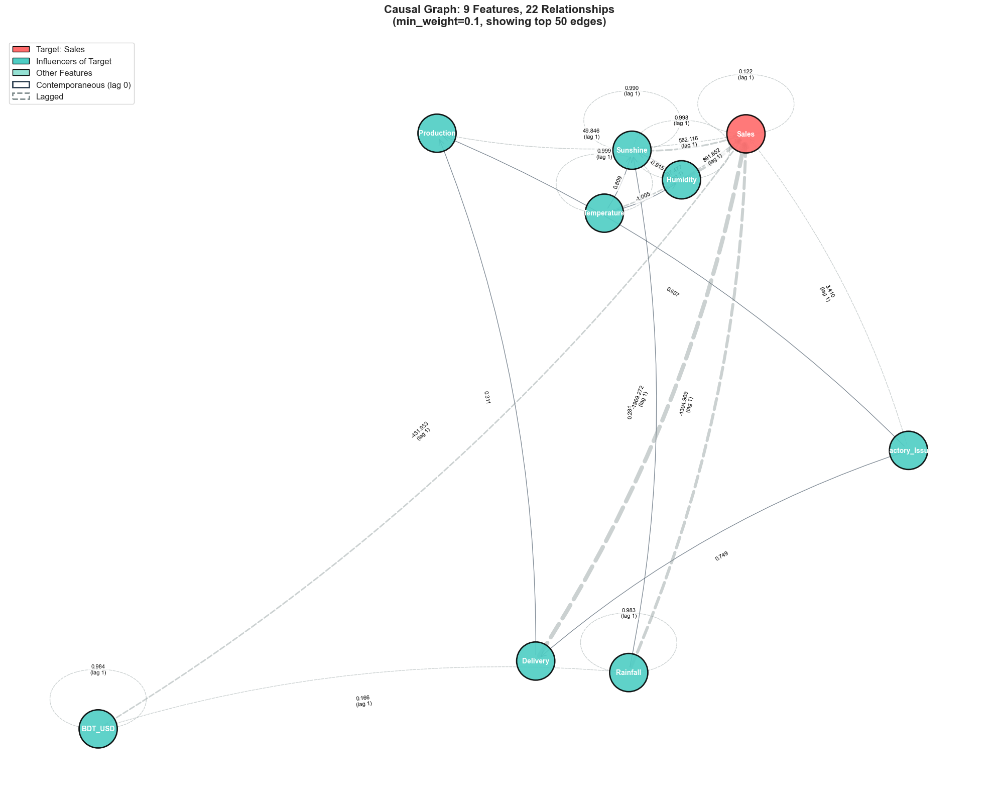


Graph Statistics:
  - Nodes: 9
  - Edges: 22
  - Lag 0 (contemporaneous) edges: 7
  - Lagged edges: 15
  - Density: 0.3056

Relationships DataFrame:


,Source,Target,Weight,Lag,abs_weight,relationship_type,is_to_target,is_from_target,source_role,target_role
0,Delivery,Sales,-1969.272036,1,1969.272036,lagged,True,False,Influencer of Target,Target
1,Rainfall,Sales,-1304.908851,1,1304.908851,lagged,True,False,Influencer of Target,Target
2,Humidity,Sales,891.651506,1,891.651506,lagged,True,False,Influencer of Target,Target
3,Sunshine,Sales,582.116098,1,582.116098,lagged,True,False,Influencer of Target,Target
4,BDT_USD,Sales,-431.932513,1,431.932513,lagged,True,False,Influencer of Target,Target
5,Temperature,Sales,387.476958,1,387.476958,lagged,True,False,Influencer of Target,Target
6,Production,Sales,49.845839,1,49.845839,lagged,True,False,Influencer of Target,Target
7,Factory_Issue,Sales,3.410443,1,3.410443,lagged,True,False,Influencer of Target,Target
8,Temperature,Humidity,-1.004699,0,1.004699,contemporaneous,False,False,Influencer of Target,Influencer of Target
9,Temperature,Humidity,1.003895,1,1.003895,lagged,False,False,Influencer of Target,Influencer of Target


In [62]:
# Usage example
G, relationships_df = visualize_causal_graph(
    edges_df=edges_df,
    target_col='Sales',
    min_weight=0.1,
    max_edges=50
)

# Display the relationships DataFrame
print("\nRelationships DataFrame:")
display(relationships_df)

# Or save it
# relationships_df.to_csv('causal_relationships.csv', index=False)

In [63]:
df_engineered

,Date,Sales,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD,...,Sunshine_lag1_x_Sales_causal,BDT_USD_lag1_x_Sales_causal,Temperature_lag1_x_Sales_causal,Production_lag1_x_Sales_causal,Factory_Issue_lag1_x_Sales_causal,Temperature_lag1_x_Humidity_causal,Humidity_lag1_x_Sunshine_causal,Temperature_lag1_x_Sunshine_causal,Rainfall_lag1_x_Sunshine_causal,Rainfall_lag1_x_BDT_USD_causal
0,2023-01-01,2642.0,0.079538,0.049447,0.038181,0.00000,0.380952,0.777778,0.222222,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.172840,0.296296,0.084656,0.000000,0.000000
1,2023-01-01,0.0,0.000000,0.000000,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.172840,0.296296,0.084656,0.000000,0.000000
2,2023-01-01,0.0,0.000000,0.000000,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.172840,0.296296,0.084656,0.000000,0.000000
3,2023-01-01,25.0,0.002545,0.002192,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,9.523810,0.0,5.555556,0.000000,0.000000,0.172840,0.296296,0.084656,0.000000,0.000000
4,2023-01-01,1507.0,0.053025,0.068359,0.008641,0.00000,0.380952,0.777778,0.222222,0.000000,...,574.095238,0.0,334.888889,3.835622,3.303308,0.172840,0.296296,0.084656,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9056,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0.000000,0.0,0.000000,0.000000,0.000000,0.618051,0.361602,0.328042,0.026667,0.059463
9057,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0.000000,0.0,0.000000,0.000000,0.000000,0.618051,0.361602,0.328042,0.026667,0.059463
9058,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0.000000,0.0,0.000000,0.000000,0.000000,0.618051,0.361602,0.328042,0.026667,0.059463
9059,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0.000000,0.0,0.000000,0.000000,0.000000,0.618051,0.361602,0.328042,0.026667,0.059463


In [64]:
dt = pd.to_datetime(df_engineered["Date"])
df_engineered["dow"] = dt.dt.dayofweek
df_engineered["is_weekend"] = (df_engineered["dow"] >= 5).astype(int)
df_engineered["dom"] = dt.dt.day
df_engineered["month"] = dt.dt.month
df_engineered["quarter"] = dt.dt.quarter
df_engineered["doy"] = dt.dt.dayofyear
iso = dt.dt.isocalendar()
df_engineered["iso_week"] = iso.week.astype(int)

# cyclic encodings
df_engineered["dow_sin"] = np.sin(2*np.pi*df_engineered["dow"]/7)
df_engineered["dow_cos"] = np.cos(2*np.pi*df_engineered["dow"]/7)
df_engineered["month_sin"] = np.sin(2*np.pi*df_engineered["month"]/12)
df_engineered["month_cos"] = np.cos(2*np.pi*df_engineered["month"]/12)

# GFor cyclic go to notes.md

In [65]:
df_engineered

,Date,Sales,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD,...,is_weekend,dom,month,quarter,doy,iso_week,dow_sin,dow_cos,month_sin,month_cos
0,2023-01-01,2642.0,0.079538,0.049447,0.038181,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
1,2023-01-01,0.0,0.000000,0.000000,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
2,2023-01-01,0.0,0.000000,0.000000,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
3,2023-01-01,25.0,0.002545,0.002192,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
4,2023-01-01,1507.0,0.053025,0.068359,0.008641,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9056,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9057,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9058,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9059,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000


<br> <br> <br>

# Generate Causality 

Generate Causality on causality-informed feature engineered dataset

In [66]:

# ==============================================================================
# PART 1: VARLiNGAM CAUSAL DISCOVERY
# ==============================================================================

def run_varlingam_analysis(csv_path, target_col='Sales', max_lag=3, output_dir='./', save_prefix='causal_relationships'):
    """
    Run VARLiNGAM causal discovery on a dataset.
    
    Parameters:
    -----------
    csv_path : str
        Path to the input CSV file
    target_col : str
        Name of the target variable
    max_lag : int
        Maximum number of lags to consider
    output_dir : str
        Directory to save output files
    save_prefix : str
        Prefix for output filenames
        
    Returns:
    --------
    edges_df : pd.DataFrame
        Complete causal relationships dataframe
    viz_edges : pd.DataFrame
        Non-zero relationships for visualization
    model : VARLiNGAM
        Fitted VARLiNGAM model
    """
    
    print("="*80)
    print("VARLiNGAM CAUSAL DISCOVERY ANALYSIS")
    print("="*80)
    
    # Load data
    print("\n1. Loading data...")
    df = pd.read_csv(csv_path)
    print(f"   Original shape: {df.shape}")
    
    # Remove Date and index columns
    print("\n2. Removing Date and index columns...")
    columns_to_remove = ['Date', 'Unnamed: 0']
    df_clean = df.drop(columns=[col for col in columns_to_remove if col in df.columns])
    print(f"   Clean shape: {df_clean.shape}")
    print(f"   Features: {list(df_clean.columns)}")
    
    # Check for missing values
    print("\n3. Checking data quality...")
    missing = df_clean.isnull().sum().sum()
    print(f"   Missing values: {missing}")
    if missing > 0:
        print("   Filling missing values with forward fill...")
        df_clean = df_clean.fillna(method='ffill').fillna(method='bfill')
    
    # Check for constant columns
    print("\n   Checking for constant columns...")
    constant_cols = []
    for col in df_clean.columns:
        if df_clean[col].std() == 0:
            constant_cols.append(col)
    if constant_cols:
        print(f"   Found {len(constant_cols)} constant columns: {constant_cols}")
        print("   Removing constant columns...")
        df_clean = df_clean.drop(columns=constant_cols)
        print(f"   New shape: {df_clean.shape}")
    
    # Check for highly correlated features (perfect multicollinearity)
    print("\n   Checking for perfect correlations...")
    corr_matrix = df_clean.corr().abs()
    upper_triangle = corr_matrix.where(
        np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    )
    to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.999)]
    if to_drop:
        print(f"   Found {len(to_drop)} perfectly correlated features")
        print(f"   Removing: {to_drop}")
        df_clean = df_clean.drop(columns=to_drop)
        print(f"   New shape: {df_clean.shape}")
    else:
        print("   No perfect correlations found")
    
    # Add small noise to avoid numerical issues
    print("\n   Adding small regularization noise...")
    noise_scale = 1e-6
    df_clean = df_clean + np.random.normal(0, noise_scale, df_clean.shape)
    
    # Verify target is in the dataset
    if target_col not in df_clean.columns:
        print(f"\n   ERROR: '{target_col}' column not found!")
        print(f"   Available columns: {list(df_clean.columns)}")
        return None, None, None
    
    print(f"   {target_col} column confirmed as target variable")
    print(f"   Final data shape: {df_clean.shape}")
    
    # Run VARLiNGAM
    print("\n4. Running VARLiNGAM causal discovery...")
    print("   This may take a few minutes for large datasets...")
    
    model = VARLiNGAM(lags=max_lag, criterion='bic', prune=False)
    
    try:
        model.fit(df_clean)
        print(f"   ✓ VARLiNGAM completed successfully with {max_lag} lags")
    except Exception as e:
        print(f"   ✗ Error running VARLiNGAM: {e}")
        return None, None, None
    
    # Extract ALL causal relationships (no filtering)
    print("\n5. Extracting ALL causal relationships...")
    feature_names = df_clean.columns.tolist()
    n_features = len(feature_names)
    
    # Get causal order
    causal_order = model.causal_order_
    
    # Extract all edges from adjacency matrices
    all_edges = []
    
    # Get the adjacency matrices for all lags
    adjacency_matrices = model.adjacency_matrices_
    
    print(f"   Extracting relationships from {len(adjacency_matrices)} lag matrices...")
    
    for lag_idx, adj_matrix in enumerate(adjacency_matrices):
        lag = lag_idx
        
        # Iterate through all pairs of features
        for i in range(n_features):
            for j in range(n_features):
                weight = adj_matrix[i, j]
                
                # Include ALL edges (even zero weights for completeness)
                source = feature_names[j]
                target = feature_names[i]
                
                # Determine relationship type
                if lag == 0:
                    if weight != 0:
                        rel_type = 'contemporaneous'
                    else:
                        rel_type = 'no_relationship_lag0'
                else:
                    if weight != 0:
                        rel_type = f'lagged_{lag}'
                    else:
                        rel_type = f'no_relationship_lag{lag}'
                
                all_edges.append({
                    'Source': source,
                    'Target': target,
                    'Weight': float(weight),
                    'abs_weight': float(abs(weight)),
                    'Lag': int(lag),
                    'relationship_type': rel_type,
                    'source_index': int(j),
                    'target_index': int(i)
                })
    
    print(f"   Total relationships extracted: {len(all_edges)}")
    
    # Create DataFrame with ALL relationships
    edges_df = pd.DataFrame(all_edges)
    
    # Add additional metadata
    print("\n6. Adding metadata...")
    
    # Identify which features directly influence the target
    edges_df['influences_target'] = (edges_df['Target'] == target_col) & (edges_df['abs_weight'] > 0)
    edges_df['influenced_by_target'] = (edges_df['Source'] == target_col) & (edges_df['abs_weight'] > 0)
    
    # Classify relationship strength
    def classify_strength(weight):
        abs_w = abs(weight)
        if abs_w == 0:
            return 'none'
        elif abs_w < 0.01:
            return 'very_weak'
        elif abs_w < 0.05:
            return 'weak'
        elif abs_w < 0.1:
            return 'moderate'
        elif abs_w < 0.5:
            return 'strong'
        else:
            return 'very_strong'
    
    edges_df['strength_category'] = edges_df['Weight'].apply(classify_strength)
    
    # Sort by absolute weight (strongest first)
    edges_df = edges_df.sort_values('abs_weight', ascending=False).reset_index(drop=True)
    
    print(f"   Metadata added successfully")
    
    # Print summary statistics
    print("\n7. Summary Statistics:")
    print(f"   {'='*60}")
    print(f"   Total features analyzed: {n_features}")
    print(f"   Total possible relationships: {len(edges_df)}")
    print(f"   Non-zero relationships: {(edges_df['abs_weight'] > 0).sum()}")
    print(f"   Zero relationships: {(edges_df['abs_weight'] == 0).sum()}")
    print(f"\n   Relationships by lag:")
    for lag in range(max_lag + 1):
        lag_edges = edges_df[edges_df['Lag'] == lag]
        nonzero = (lag_edges['abs_weight'] > 0).sum()
        print(f"      Lag {lag}: {len(lag_edges)} total, {nonzero} non-zero")
    
    print(f"\n   Direct influences on '{target_col}':")
    target_influences = edges_df[edges_df['influences_target'] == True].sort_values('abs_weight', ascending=False)
    if len(target_influences) > 0:
        print(f"      {len(target_influences)} features directly influence {target_col}")
        for idx, row in target_influences.head(10).iterrows():
            print(f"         {row['Source']} → {row['Target']}: {row['Weight']:.6f} (lag {row['Lag']})")
    else:
        print(f"      No direct influences found")
    
    print(f"\n   Strength distribution:")
    strength_counts = edges_df['strength_category'].value_counts()
    for strength, count in strength_counts.items():
        pct = 100 * count / len(edges_df)
        print(f"      {strength}: {count} ({pct:.1f}%)")
    
    # Save to CSV
    print("\n8. Saving results to CSV...")
    csv_path = f"{output_dir}/{save_prefix}_complete.csv"
    edges_df.to_csv(csv_path, index=False)
    print(f"   ✓ Saved to: {csv_path}")
    
    # Save to JSON
    print("\n9. Saving results to JSON...")
    json_path = f"{output_dir}/{save_prefix}_complete.json"
    
    # Create JSON structure
    json_output = {
        'metadata': {
            'target_variable': target_col,
            'n_features': n_features,
            'max_lag': max_lag,
            'total_relationships': len(edges_df),
            'nonzero_relationships': int((edges_df['abs_weight'] > 0).sum()),
            'feature_names': feature_names
        },
        'relationships': edges_df.to_dict('records')
    }
    
    with open(json_path, 'w') as f:
        json.dump(json_output, f, indent=2)
    print(f"   ✓ Saved to: {json_path}")
    
    # Create a filtered version for visualization (top relationships)
    print("\n10. Creating visualization subset...")
    viz_edges = edges_df[edges_df['abs_weight'] > 0].copy()
    print(f"   Using {len(viz_edges)} non-zero relationships for visualization")
    
    # Save visualization subset
    viz_csv_path = f"{output_dir}/{save_prefix}_viz.csv"
    viz_edges.to_csv(viz_csv_path, index=False)
    print(f"   ✓ Saved visualization subset to: {viz_csv_path}")
    
    print("\n" + "="*80)
    print("ANALYSIS COMPLETE")
    print("="*80)
    
    return edges_df, viz_edges, model




<br> <br> <br>

### Causality Graph Visualization

In [67]:
# # ==============================================================================
# # PART 2: VISUALIZATION FUNCTIONS
# # ==============================================================================

def visualize_causal_graph(edges_df, target_col='Sales', min_weight=0.0, max_edges=100, figsize=(24, 20), node_size=3000, font_size=9, show_weights=True, layout='spring'):
    """
    Visualize the causal graph from VARLiNGAM results.
    
    Parameters:
    -----------
    edges_df : pd.DataFrame
        DataFrame containing the causal edges
    target_col : str
        Target variable to highlight
    min_weight : float
        Minimum absolute weight threshold for edges to display
    max_edges : int
        Maximum number of edges to display (top by weight)
    figsize : tuple
        Figure size
    node_size : int
        Size of nodes
    font_size : int
        Font size for labels
    show_weights : bool
        Whether to show edge weights
    layout : str
        Layout algorithm: 'spring', 'circular', 'kamada_kawai', 'shell'
        
    Returns:
    --------
    G : nx.DiGraph
        The directed graph object
    relationships_df : pd.DataFrame
        DataFrame containing all the relationships displayed in the graph
    fig : matplotlib.figure.Figure
        The figure object
    """
    # Filter edges by weight threshold
    filtered_edges = edges_df[edges_df['abs_weight'] >= min_weight].copy()
    
    # Take top edges by absolute weight
    if max_edges and len(filtered_edges) > max_edges:
        filtered_edges = filtered_edges.nsmallest(max_edges, 'abs_weight')
    
    print(f"Visualizing {len(filtered_edges)} edges (min_weight={min_weight}, max_edges={max_edges})")
    
    # Create directed graph
    G = nx.DiGraph()
    
    # Add edges with attributes
    for _, row in filtered_edges.iterrows():
        G.add_edge(
            row['Source'], 
            row['Target'],
            weight=row['Weight'],
            abs_weight=row['abs_weight'],
            lag=row['Lag'],
            relationship_type=row['relationship_type']
        )
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Choose layout
    if layout == 'spring':
        pos = nx.spring_layout(G, k=3, iterations=50, seed=42)
    elif layout == 'circular':
        pos = nx.circular_layout(G)
    elif layout == 'kamada_kawai':
        try:
            pos = nx.kamada_kawai_layout(G)
        except:
            pos = nx.spring_layout(G, seed=42)
    elif layout == 'shell':
        pos = nx.shell_layout(G)
    else:
        pos = nx.spring_layout(G, seed=42)
    
    # Get node colors
    node_colors = []
    for node in G.nodes():
        if node == target_col:
            node_colors.append('#FF6B6B')  # Red for target
        elif any(filtered_edges[(filtered_edges['Target'] == target_col) & 
                                (filtered_edges['Source'] == node)]['abs_weight'] > 0):
            node_colors.append('#4ECDC4')  # Teal for influencers of target
        else:
            node_colors.append('#95E1D3')  # Light teal for others
    
    # Draw nodes
    nx.draw_networkx_nodes(
        G, pos, 
        node_color=node_colors,
        node_size=node_size,
        alpha=0.9,
        edgecolors='black',
        linewidths=2,
        ax=ax
    )
    
    # Separate edges by lag for different styles
    lag_0_edges = [(u, v) for u, v, d in G.edges(data=True) if d['lag'] == 0]
    lag_gt_0_edges = [(u, v) for u, v, d in G.edges(data=True) if d['lag'] > 0]
    
    # Get edge weights for width
    edge_weights_0 = [G[u][v]['abs_weight'] for u, v in lag_0_edges]
    edge_weights_gt = [G[u][v]['abs_weight'] for u, v in lag_gt_0_edges]
    
    # Normalize edge widths
    if edge_weights_0 or edge_weights_gt:
        all_weights = edge_weights_0 + edge_weights_gt
        max_weight = max(all_weights)
        min_weight_viz = min(all_weights)
        
        if max_weight > 0:
            if edge_weights_0:
                edge_widths_0 = [0.5 + 4 * (w - min_weight_viz) / (max_weight - min_weight_viz + 1e-10) 
                                for w in edge_weights_0]
            else:
                edge_widths_0 = []
                
            if edge_weights_gt:
                edge_widths_gt = [0.5 + 4 * (w - min_weight_viz) / (max_weight - min_weight_viz + 1e-10) 
                                 for w in edge_weights_gt]
            else:
                edge_widths_gt = []
        else:
            edge_widths_0 = [1.0] * len(edge_weights_0)
            edge_widths_gt = [1.0] * len(edge_weights_gt)
    else:
        edge_widths_0 = []
        edge_widths_gt = []
    
    # Draw lag 0 edges (solid)
    if lag_0_edges:
        nx.draw_networkx_edges(
            G, pos,
            edgelist=lag_0_edges,
            width=edge_widths_0,
            alpha=0.6,
            edge_color='#2C3E50',
            style='solid',
            arrows=True,
            arrowsize=20,
            arrowstyle='->',
            connectionstyle='arc3,rad=0.1',
            ax=ax
        )
    
    # Draw lagged edges (dashed)
    if lag_gt_0_edges:
        nx.draw_networkx_edges(
            G, pos,
            edgelist=lag_gt_0_edges,
            width=edge_widths_gt,
            alpha=0.5,
            edge_color='#7F8C8D',
            style='dashed',
            arrows=True,
            arrowsize=15,
            arrowstyle='->',
            connectionstyle='arc3,rad=0.1',
            ax=ax
        )
    
    # Draw labels
    nx.draw_networkx_labels(
        G, pos,
        font_size=font_size,
        font_weight='bold',
        font_color='white',
        ax=ax
    )
    
    # Draw edge labels (weights) if requested
    if show_weights and len(G.edges()) <= 50:
        edge_labels = {}
        for u, v, d in G.edges(data=True):
            label = f"{d['weight']:.2e}"
            if d['lag'] > 0:
                label += f"\n(L{d['lag']})"
            edge_labels[(u, v)] = label
        
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels=edge_labels,
            font_size=font_size - 2,
            font_color='black',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7),
            ax=ax
        )
    
    # Create legend
    legend_elements = [
        mpatches.Patch(facecolor='#FF6B6B', edgecolor='black', label=f'Target: {target_col}'),
        mpatches.Patch(facecolor='#4ECDC4', edgecolor='black', label='Direct Influencers of Target'),
        mpatches.Patch(facecolor='#95E1D3', edgecolor='black', label='Other Features'),
        mpatches.Patch(facecolor='white', edgecolor='#2C3E50', label='Contemporaneous (lag 0)', linewidth=2),
        mpatches.Patch(facecolor='white', edgecolor='#7F8C8D', label='Lagged (lag > 0)', linewidth=2, linestyle='--')
    ]
    ax.legend(handles=legend_elements, loc='upper left', fontsize=font_size + 2, framealpha=0.95)
    
    ax.set_title(f'Causal Graph: {len(G.nodes())} Features, {len(G.edges())} Relationships\n'
                 f'(min_weight={min_weight:.1e}, showing top {len(filtered_edges)} edges)',
                 fontsize=font_size + 8, fontweight='bold', pad=20)
    ax.axis('off')
    
    plt.tight_layout()
    
    # Print summary statistics
    print(f"\nGraph Statistics:")
    print(f"  - Nodes: {len(G.nodes())}")
    print(f"  - Edges: {len(G.edges())}")
    print(f"  - Lag 0 (contemporaneous) edges: {len(lag_0_edges)}")
    print(f"  - Lagged edges: {len(lag_gt_0_edges)}")
    print(f"  - Density: {nx.density(G):.4f}")
    
    # Create relationships DataFrame from the filtered edges
    relationships_df = filtered_edges.copy()
    
    # Add node role information
    relationships_df['source_role'] = relationships_df['Source'].apply(
        lambda x: 'Target' if x == target_col else 
                 'Influencer of Target' if x in filtered_edges[filtered_edges['Target'] == target_col]['Source'].values else 
                 'Other'
    )
    relationships_df['target_role'] = relationships_df['Target'].apply(
        lambda x: 'Target' if x == target_col else 
                 'Influencer of Target' if x in filtered_edges[filtered_edges['Target'] == target_col]['Source'].values else 
                 'Other'
    )
    
    # Sort by absolute weight descending
    relationships_df = relationships_df.sort_values('abs_weight', ascending=False).reset_index(drop=True)
    
    return G, relationships_df, fig





"""
IMPROVED CAUSAL GRAPH VISUALIZATION
Fixed colors and multiple layout options for better readability
"""

def visualize_causal_graph_improved(edges_df, target_col='Sales', min_weight=0.0, max_edges=50, figsize=(24, 20), node_size=3000, font_size=10, show_weights=True, layout='spring', theme='light'):
    """
    Improved visualization with better readability.
    
    Parameters:
    -----------
    edges_df : pd.DataFrame
        DataFrame containing the causal edges
    target_col : str
        Target variable to highlight
    min_weight : float
        Minimum absolute weight threshold
    max_edges : int
        Maximum number of edges to display
    figsize : tuple
        Figure size
    node_size : int
        Size of nodes
    font_size : int
        Font size for labels
    show_weights : bool
        Whether to show edge weights
    layout : str
        Layout: 'spring', 'circular', 'hierarchical', 'kamada_kawai', 'shell', 'spectral'
    theme : str
        Color theme: 'light' or 'dark'
        
    Returns:
    --------
    G : networkx.DiGraph
        The graph object
    fig : matplotlib.figure.Figure
        The figure object
    """
    
    # Filter edges
    filtered_edges = edges_df[edges_df['abs_weight'] >= min_weight].copy()
    if max_edges and len(filtered_edges) > max_edges:
        filtered_edges = filtered_edges.nsmallest(max_edges, 'abs_weight')
    
    print(f"Visualizing {len(filtered_edges)} edges (layout: {layout}, theme: {theme})")
    
    # Create graph
    G = nx.DiGraph()
    for _, row in filtered_edges.iterrows():
        G.add_edge(row['Source'], row['Target'],
                  weight=row['Weight'],
                  abs_weight=row['abs_weight'],
                  lag=row['Lag'])
    
    # Create figure with appropriate background
    fig, ax = plt.subplots(figsize=figsize)
    if theme == 'dark':
        fig.patch.set_facecolor('#2C3E50')
        ax.set_facecolor('#2C3E50')
    else:
        fig.patch.set_facecolor('white')
        ax.set_facecolor('white')
    
    # Choose layout
    print(f"   Computing {layout} layout...")
    if layout == 'spring':
        pos = nx.spring_layout(G, k=3, iterations=100, seed=42)
    elif layout == 'circular':
        pos = nx.circular_layout(G)
    elif layout == 'hierarchical':
        # Hierarchical layout with target at top
        try:
            # Try to create layers based on distance from target
            if target_col in G.nodes():
                layers = {}
                # Target at top (layer 0)
                layers[target_col] = 0
                # Direct influencers at layer 1
                influencers = list(G.predecessors(target_col))
                for node in influencers:
                    if node not in layers:
                        layers[node] = 1
                # Others at layer 2
                for node in G.nodes():
                    if node not in layers:
                        layers[node] = 2
                
                # Create positions
                pos = {}
                for layer_num in range(3):
                    layer_nodes = [n for n, l in layers.items() if l == layer_num]
                    for i, node in enumerate(layer_nodes):
                        x = (i - len(layer_nodes)/2) / (len(layer_nodes) + 1)
                        y = 1 - layer_num * 0.4
                        pos[node] = np.array([x, y])
            else:
                pos = nx.spring_layout(G, seed=42)
        except:
            pos = nx.spring_layout(G, seed=42)
    elif layout == 'kamada_kawai':
        try:
            pos = nx.kamada_kawai_layout(G)
        except:
            pos = nx.spring_layout(G, seed=42)
    elif layout == 'shell':
        # Put target in center, influencers in inner shell, others in outer shell
        if target_col in G.nodes():
            influencers = list(G.predecessors(target_col))
            others = [n for n in G.nodes() if n != target_col and n not in influencers]
            shells = [[target_col], influencers, others] if others else [[target_col], influencers]
            shells = [s for s in shells if s]  # Remove empty shells
            pos = nx.shell_layout(G, shells)
        else:
            pos = nx.shell_layout(G)
    elif layout == 'spectral':
        try:
            pos = nx.spectral_layout(G)
        except:
            pos = nx.spring_layout(G, seed=42)
    else:
        pos = nx.spring_layout(G, seed=42)
    
    # Color schemes
    if theme == 'dark':
        # Dark theme colors
        target_color = '#FF6B6B'
        influencer_color = '#4ECDC4'
        other_color = '#95E1D3'
        font_color = 'white'
        edge_color_0 = '#ECF0F1'
        edge_color_lag = '#BDC3C7'
        legend_bg = '#34495E'
    else:
        # Light theme colors - FIXED FONT COLOR
        target_color = '#FF6B6B'
        influencer_color = '#4ECDC4'
        other_color = '#C8E6E3'
        font_color = 'black'  # CHANGED FROM WHITE TO BLACK
        edge_color_0 = '#2C3E50'
        edge_color_lag = '#7F8C8D'
        legend_bg = 'white'
    
    # Assign colors to nodes
    node_colors = []
    for node in G.nodes():
        if node == target_col:
            node_colors.append(target_color)
        elif any(filtered_edges[(filtered_edges['Target'] == target_col) & 
                                (filtered_edges['Source'] == node)]['abs_weight'] > 0):
            node_colors.append(influencer_color)
        else:
            node_colors.append(other_color)
    
    # Draw nodes
    nx.draw_networkx_nodes(G, pos, 
                          node_color=node_colors,
                          node_size=node_size,
                          alpha=0.95,
                          edgecolors='black',
                          linewidths=2.5,
                          ax=ax)
    
    # Separate edges by lag
    lag_0_edges = [(u, v) for u, v, d in G.edges(data=True) if d['lag'] == 0]
    lag_gt_0_edges = [(u, v) for u, v, d in G.edges(data=True) if d['lag'] > 0]
    
    # Calculate edge widths
    all_weights = [G[u][v]['abs_weight'] for u, v in G.edges()]
    if all_weights:
        max_weight = max(all_weights)
        min_weight_viz = min(all_weights)
        
        if lag_0_edges:
            edge_widths_0 = [1 + 5 * (G[u][v]['abs_weight'] - min_weight_viz) / (max_weight - min_weight_viz + 1e-10) 
                            for u, v in lag_0_edges]
        else:
            edge_widths_0 = []
            
        if lag_gt_0_edges:
            edge_widths_gt = [1 + 5 * (G[u][v]['abs_weight'] - min_weight_viz) / (max_weight - min_weight_viz + 1e-10) 
                             for u, v in lag_gt_0_edges]
        else:
            edge_widths_gt = []
    else:
        edge_widths_0 = []
        edge_widths_gt = []
    
    # Draw edges
    if lag_0_edges:
        nx.draw_networkx_edges(G, pos,
                              edgelist=lag_0_edges,
                              width=edge_widths_0,
                              alpha=0.7,
                              edge_color=edge_color_0,
                              style='solid',
                              arrows=True,
                              arrowsize=25,
                              arrowstyle='-|>',
                              connectionstyle='arc3,rad=0.15',
                              ax=ax)
    
    if lag_gt_0_edges:
        nx.draw_networkx_edges(G, pos,
                              edgelist=lag_gt_0_edges,
                              width=edge_widths_gt,
                              alpha=0.6,
                              edge_color=edge_color_lag,
                              style='dashed',
                              arrows=True,
                              arrowsize=20,
                              arrowstyle='-|>',
                              connectionstyle='arc3,rad=0.15',
                              ax=ax)
    
    # Draw labels with appropriate font color
    nx.draw_networkx_labels(G, pos,
                           font_size=font_size,
                           font_weight='bold',
                           font_color=font_color,  # Now uses correct color
                           ax=ax)
    
    # Draw edge weights if requested (only for smaller graphs)
    if show_weights and len(G.edges()) <= 40:
        edge_labels = {}
        for u, v, d in G.edges(data=True):
            if d['abs_weight'] > 0:
                label = f"{d['weight']:.2e}"
                if d['lag'] > 0:
                    label += f"\nL{d['lag']}"
                edge_labels[(u, v)] = label
        
        nx.draw_networkx_edge_labels(G, pos,
                                     edge_labels=edge_labels,
                                     font_size=max(6, font_size - 3),
                                     font_color='black',
                                     bbox=dict(boxstyle='round,pad=0.3', 
                                             facecolor='white', 
                                             alpha=0.8,
                                             edgecolor='gray'),
                                     ax=ax)
    
    # Legend
    legend_elements = [
        mpatches.Patch(facecolor=target_color, edgecolor='black', 
                      label=f'Target: {target_col}', linewidth=2),
        mpatches.Patch(facecolor=influencer_color, edgecolor='black', 
                      label='Direct Influencers', linewidth=2),
        mpatches.Patch(facecolor=other_color, edgecolor='black', 
                      label='Other Features', linewidth=2),
        mpatches.Patch(facecolor='white', edgecolor=edge_color_0, 
                      label='Contemporaneous (lag 0)', linewidth=2.5),
        mpatches.Patch(facecolor='white', edgecolor=edge_color_lag, 
                      label='Lagged (lag > 0)', linewidth=2.5, linestyle='--')
    ]
    
    legend = ax.legend(handles=legend_elements, 
                      loc='upper left', 
                      fontsize=font_size + 2,
                      framealpha=0.95,
                      facecolor=legend_bg,
                      edgecolor='black',
                      frameon=True)
    
    if theme == 'dark':
        for text in legend.get_texts():
            text.set_color('white')
    
    # Title
    title_color = 'white' if theme == 'dark' else 'black'
    ax.set_title(f'Causal Graph: {len(G.nodes())} Features, {len(G.edges())} Relationships\n'
                 f'Layout: {layout.upper()} | Target: {target_col}',
                 fontsize=font_size + 8, 
                 fontweight='bold', 
                 pad=20,
                 color=title_color)
    
    ax.axis('off')
    plt.tight_layout()
    
    print(f"   ✓ Graph created: {len(G.nodes())} nodes, {len(G.edges())} edges")
    
    return G, fig




In [68]:
# Configuration
INPUT_CSV = "C:/Users/Iman/OneDrive/Desktop/df.csv" # df_engineered # 'your_data.csv'  # Change this to your CSV file path
TARGET_VARIABLE = 'Sales'     # Change this to your target variable
MAX_LAG = 3                   # Number of lags to analyze
OUTPUT_DIR = '../causality/causality_informed/'             # Output directory

print("Starting VARLiNGAM Analysis...")
print(f"Input file: {INPUT_CSV}")
print(f"Target variable: {TARGET_VARIABLE}")
print(f"Max lag: {MAX_LAG}")
print()

# Step 1: Run VARLiNGAM analysis
edges_df, viz_edges, model = run_varlingam_analysis(
    csv_path=INPUT_CSV,
    target_col=TARGET_VARIABLE,
    max_lag=MAX_LAG,
    output_dir=OUTPUT_DIR,
    save_prefix='causal_relationships'
)

if edges_df is None:
    print("Analysis failed. Please check the error messages above.")
    exit(1)

# Step 2: Create visualizations
print("\n" + "="*80)
print("CREATING VISUALIZATIONS")
print("="*80)


Starting VARLiNGAM Analysis...
Input file: C:/Users/Iman/OneDrive/Desktop/df.csv
Target variable: Sales
Max lag: 3

VARLiNGAM CAUSAL DISCOVERY ANALYSIS

1. Loading data...
   Original shape: (9061, 73)

2. Removing Date and index columns...
   Clean shape: (9061, 71)
   Features: ['Sales', 'Production', 'Factory_Issue', 'Delivery', 'Rainfall', 'Sunshine', 'Humidity', 'Temperature', 'BDT_USD', 'Temperature_x_Humidity_causal', 'Humidity_x_Sunshine_causal', 'Temperature_x_Sunshine_causal', 'Factory_Issue_x_Delivery_causal', 'Factory_Issue_x_Production_causal', 'Delivery_x_Production_causal', 'Rainfall_x_Sunshine_causal', 'Rainfall_x_BDT_USD_causal', 'Delivery_weighted_to_Sales_lag1', 'Rainfall_weighted_to_Sales_lag1', 'Humidity_weighted_to_Sales_lag1', 'Sunshine_weighted_to_Sales_lag1', 'BDT_USD_weighted_to_Sales_lag1', 'Temperature_weighted_to_Sales_lag1', 'Production_weighted_to_Sales_lag1', 'Factory_Issue_weighted_to_Sales_lag1', 'Temperature_weighted_to_Humidity_lag0', 'Temperature_we

In [69]:
# edges_df 

# viz_edges 

# model


1. Creating Top 100 Strongest Relationships visualization...
Visualizing 100 edges (min_weight=0.0, max_edges=100)

Graph Statistics:
  - Nodes: 41
  - Edges: 100
  - Lag 0 (contemporaneous) edges: 0
  - Lagged edges: 100
  - Density: 0.0610
   ✓ Saved to: causal_graph_top100.png


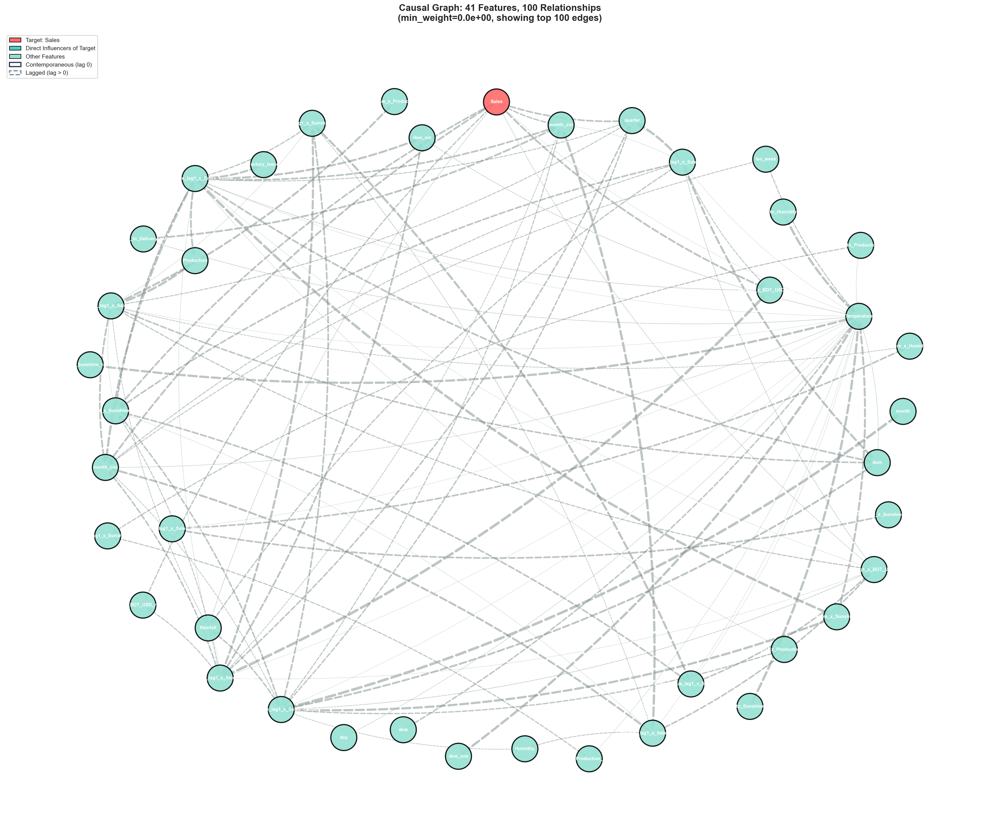

In [70]:
# Visualization 1: Top 100 strongest relationships
print("\n1. Creating Top 100 Strongest Relationships visualization...")
G1, rel_df1, fig1 = visualize_causal_graph(
    viz_edges, 
    target_col=TARGET_VARIABLE,
    min_weight=0.0,
    max_edges=100,
    figsize=(24, 20),
    node_size=2000,
    font_size=8,
    show_weights=False,
    layout='spring'
)
plt.savefig(f'{OUTPUT_DIR}/causal_graph_top100.png', dpi=150, bbox_inches='tight')
print("   ✓ Saved to: causal_graph_top100.png")
plt.close()

Image(filename=f'{OUTPUT_DIR}/causal_graph_top100.png', width=1500, height=1000)  


2. Creating Top 50 Strongest Relationships visualization...
Visualizing 50 edges (min_weight=0.0, max_edges=50)

Graph Statistics:
  - Nodes: 30
  - Edges: 50
  - Lag 0 (contemporaneous) edges: 0
  - Lagged edges: 50
  - Density: 0.0575
   ✓ Saved to: causal_graph_top50.png


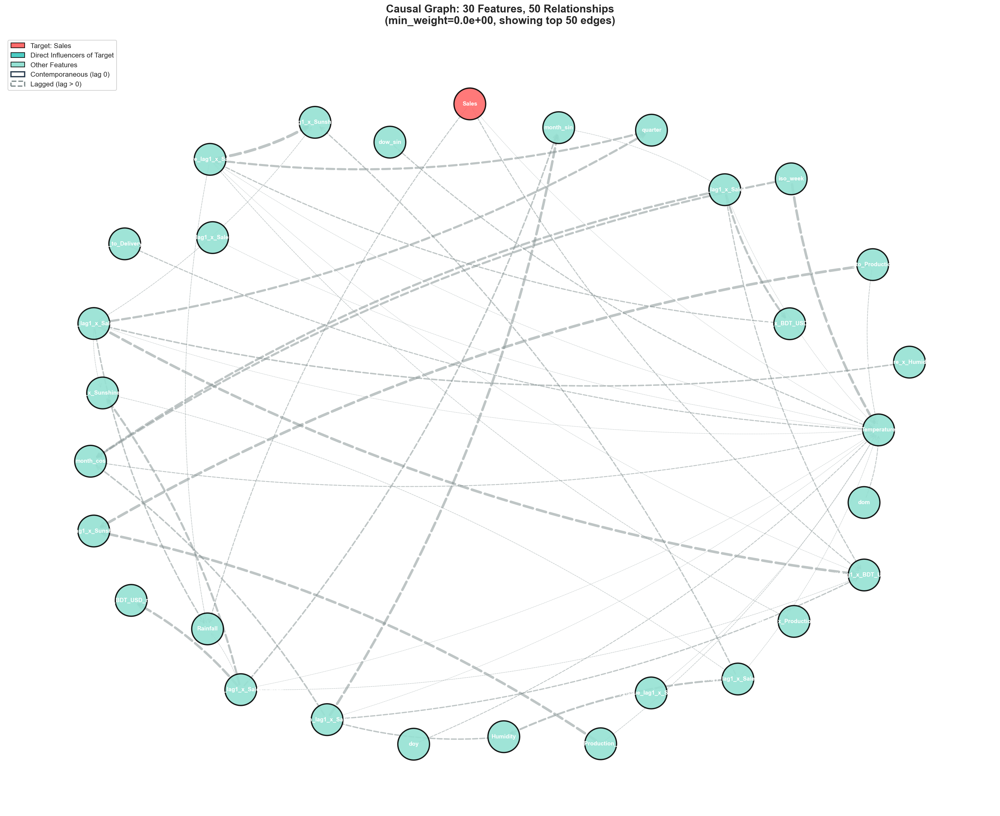

In [71]:
# Visualization 2: Top 50 strongest relationships
print("\n2. Creating Top 50 Strongest Relationships visualization...")
G2, rel_df2, fig2 = visualize_causal_graph(
    viz_edges, 
    target_col=TARGET_VARIABLE,
    min_weight=0.0,
    max_edges=50,
    figsize=(22, 18),
    node_size=2500,
    font_size=9,
    show_weights=False,
    layout='spring'
)
plt.savefig(f'{OUTPUT_DIR}/causal_graph_top50.png', dpi=150, bbox_inches='tight')
print("   ✓ Saved to: causal_graph_top50.png")
plt.close()

Image(filename=f'{OUTPUT_DIR}/causal_graph_top50.png', width=1500, height=1000)  


3. Creating Direct Influencers of Sales visualization...
Visualizing 30 edges (min_weight=0.0, max_edges=30)

Graph Statistics:
  - Nodes: 24
  - Edges: 24
  - Lag 0 (contemporaneous) edges: 6
  - Lagged edges: 18
  - Density: 0.0435
   ✓ Saved to: causal_graph_sales_influencers.png


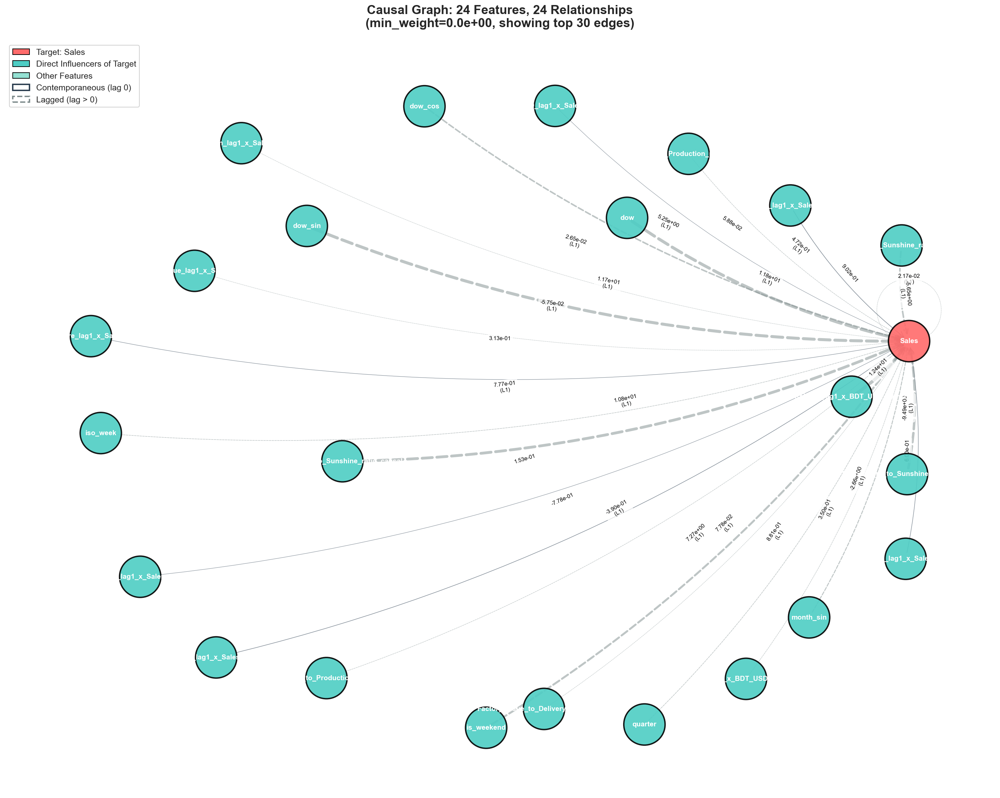

In [72]:
# Visualization 3: Direct influencers of target
print(f"\n3. Creating Direct Influencers of {TARGET_VARIABLE} visualization...")
target_influencers = viz_edges[viz_edges['Target'] == TARGET_VARIABLE].copy()
if len(target_influencers) > 0:
    G3, rel_df3, fig3 = visualize_causal_graph(
        target_influencers, 
        target_col=TARGET_VARIABLE,
        min_weight=0.0,
        max_edges=30,
        figsize=(20, 16),
        node_size=3500,
        font_size=10,
        show_weights=True,
        layout='spring'
    )
    plt.savefig(f'{OUTPUT_DIR}/causal_graph_{TARGET_VARIABLE.lower()}_influencers.png', dpi=150, bbox_inches='tight')
    print(f"   ✓ Saved to: causal_graph_{TARGET_VARIABLE.lower()}_influencers.png")
    plt.close()
else:
    print(f"   No direct influencers found for {TARGET_VARIABLE}")

Image(filename=f'{OUTPUT_DIR}/causal_graph_{TARGET_VARIABLE.lower()}_influencers.png', width=1500, height=1000)  

<br> <br> <br>

### Improved Visualization

In [73]:
print("="*80)
print("IMPROVED CAUSAL GRAPH VISUALIZATION")
print("="*80)

# Load data
print("\nLoading causal relationships...")
try:
    edges_df = pd.read_csv('../causality/causality_informed/causal_relationships_viz.csv')
except FileNotFoundError:
    edges_df = pd.read_csv('causal_relationships.csv')
    edges_df = edges_df[edges_df['abs_weight'] > 0]

print(f"Loaded {len(edges_df)} relationships")

# Configuration
TARGET = 'Sales'

# Get target-specific edges for focused view
target_edges = edges_df[edges_df['Target'] == TARGET].copy()

IMPROVED CAUSAL GRAPH VISUALIZATION

Loading causal relationships...
Loaded 2723 relationships



1. HIERARCHICAL LAYOUT (Recommended)
Visualizing 30 edges (layout: hierarchical, theme: light)
   Computing hierarchical layout...
   ✓ Graph created: 24 nodes, 24 edges
   ✓ Saved: causal_graph_hierarchical.png


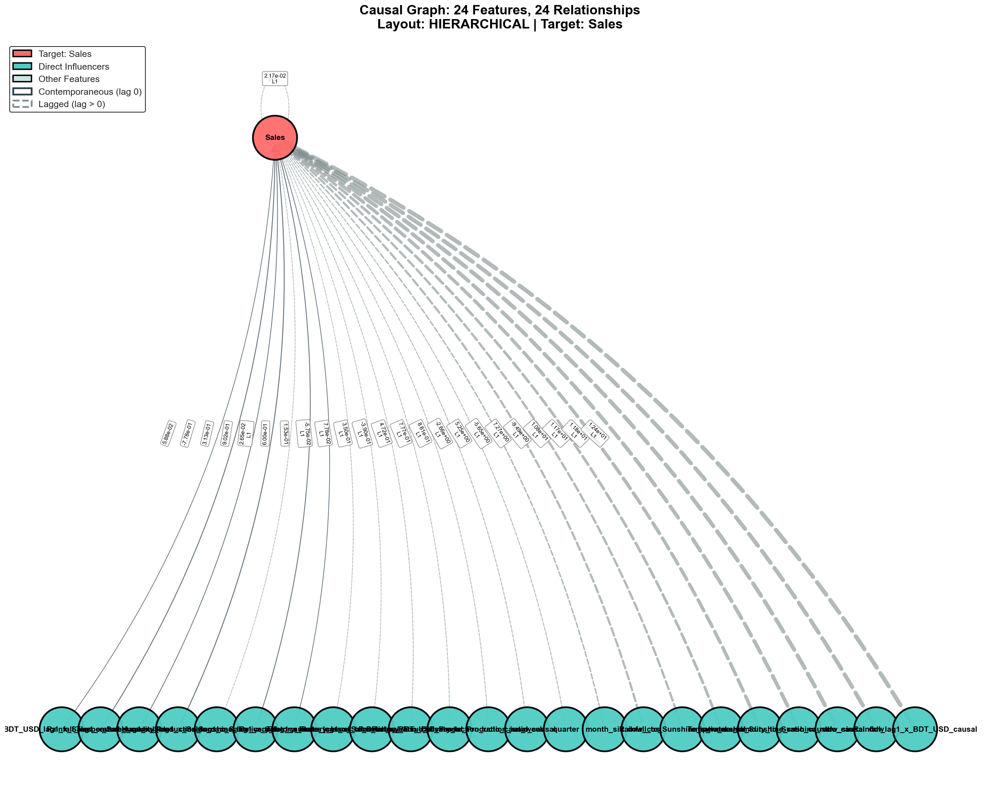

In [74]:
print("\n" + "="*80)
print("1. HIERARCHICAL LAYOUT (Recommended)")
print("="*80)
G1, fig1 = visualize_causal_graph_improved(
    edges_df=target_edges,
    target_col=TARGET,
    max_edges=30,
    figsize=(20, 16),
    node_size=4000,
    font_size=11,
    show_weights=True,
    layout='hierarchical',
    theme='light'
)
plt.savefig(f'{OUTPUT_DIR}/causal_graph_hierarchical_improved.png', dpi=150, bbox_inches='tight', facecolor='white')
print("   ✓ Saved: causal_graph_hierarchical.png")
plt.close()

Image(filename=f'{OUTPUT_DIR}/causal_graph_hierarchical_improved.png', width=1500, height=1000)  


2. SHELL LAYOUT (Target-Centered)
Visualizing 30 edges (layout: shell, theme: light)
   Computing shell layout...
   ✓ Graph created: 24 nodes, 24 edges
   ✓ Saved: causal_graph_shell.png


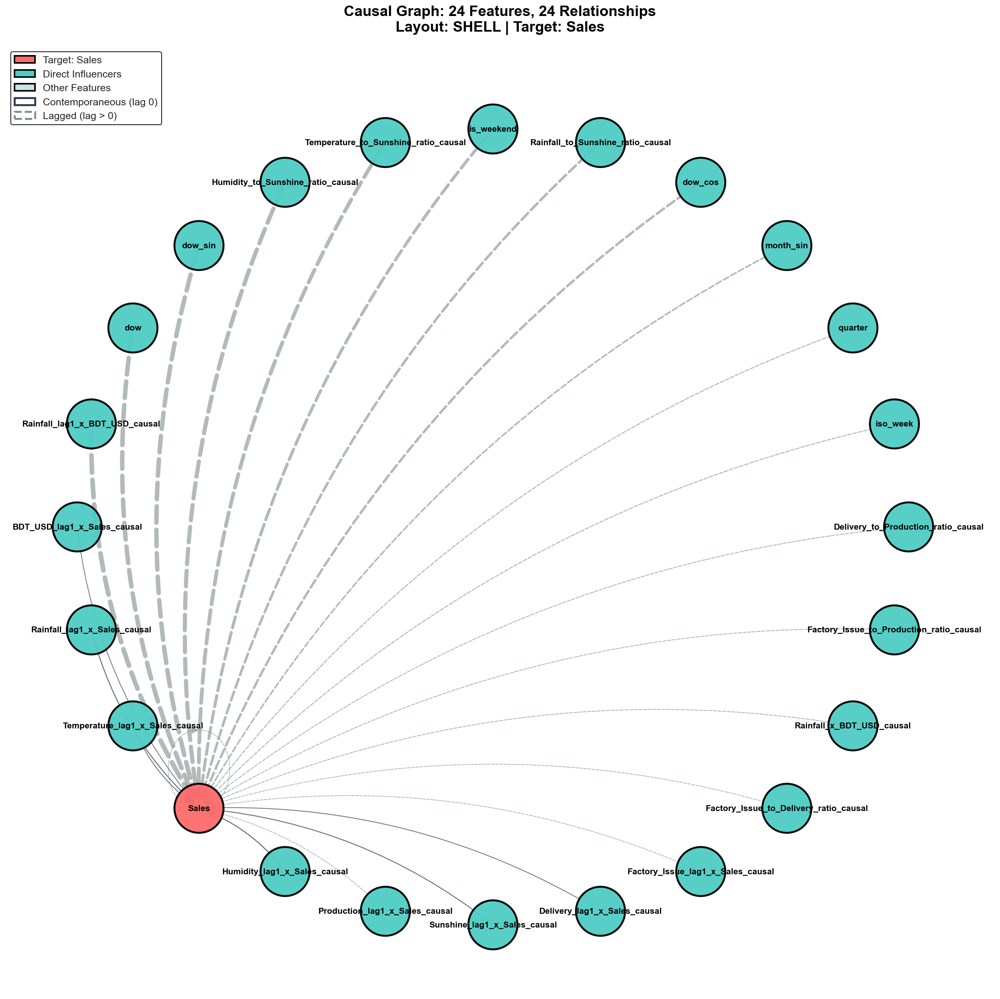

In [75]:
# ============================================================================
# 2. SHELL LAYOUT (TARGET IN CENTER)
# ============================================================================
print("\n" + "="*80)
print("2. SHELL LAYOUT (Target-Centered)")
print("="*80)
G2, fig2 = visualize_causal_graph_improved(
    edges_df=target_edges,
    target_col=TARGET,
    max_edges=30,
    figsize=(18, 18),
    node_size=4000,
    font_size=11,
    show_weights=False,
    layout='shell',
    theme='light'
)
plt.savefig(f'{OUTPUT_DIR}/causal_graph_shell.png', dpi=150, bbox_inches='tight', facecolor='white')
print("   ✓ Saved: causal_graph_shell.png")
plt.close()
Image(filename=f'{OUTPUT_DIR}/causal_graph_shell.png', width=1500, height=1000)  


3. CIRCULAR LAYOUT (Clean View)
Visualizing 25 edges (layout: circular, theme: light)
   Computing circular layout...
   ✓ Graph created: 19 nodes, 19 edges
   ✓ Saved: causal_graph_circular.png


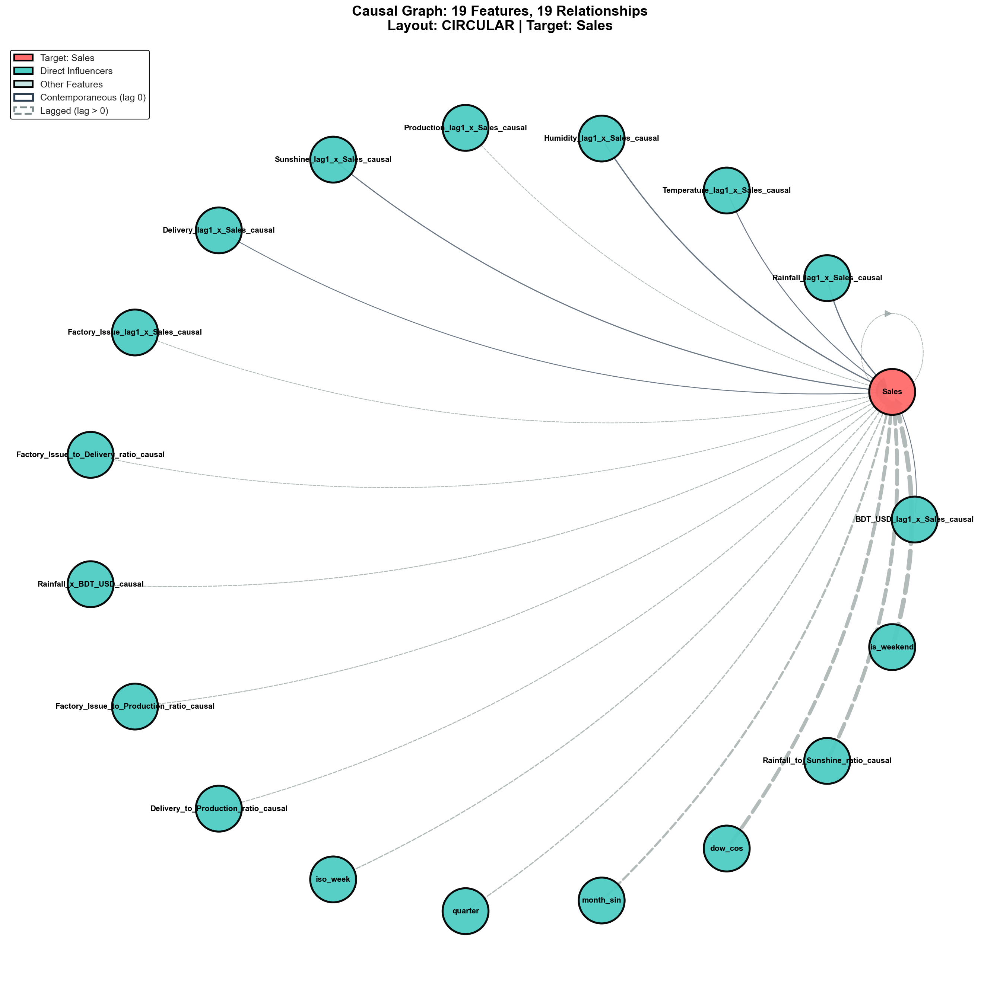

In [76]:

# ============================================================================
# 3. CIRCULAR LAYOUT (CLEAN & ORGANIZED)
# ============================================================================
print("\n" + "="*80)
print("3. CIRCULAR LAYOUT (Clean View)")
print("="*80)
G3, fig3 = visualize_causal_graph_improved(
    edges_df=target_edges,
    target_col=TARGET,
    max_edges=25,
    figsize=(18, 18),
    node_size=3500,
    font_size=10,
    show_weights=False,
    layout='circular',
    theme='light'
)
plt.savefig(f'{OUTPUT_DIR}/causal_graph_circular.png', dpi=150, bbox_inches='tight', facecolor='white')
print("   ✓ Saved: causal_graph_circular.png")
plt.close()
Image(filename=f'{OUTPUT_DIR}/causal_graph_circular.png', width=1500, height=1000)  


4. SPRING LAYOUT - Improved (Natural Clustering)
Visualizing 50 edges (layout: spring, theme: light)
   Computing spring layout...
   ✓ Graph created: 30 nodes, 50 edges
   ✓ Saved: causal_graph_spring_improved.png


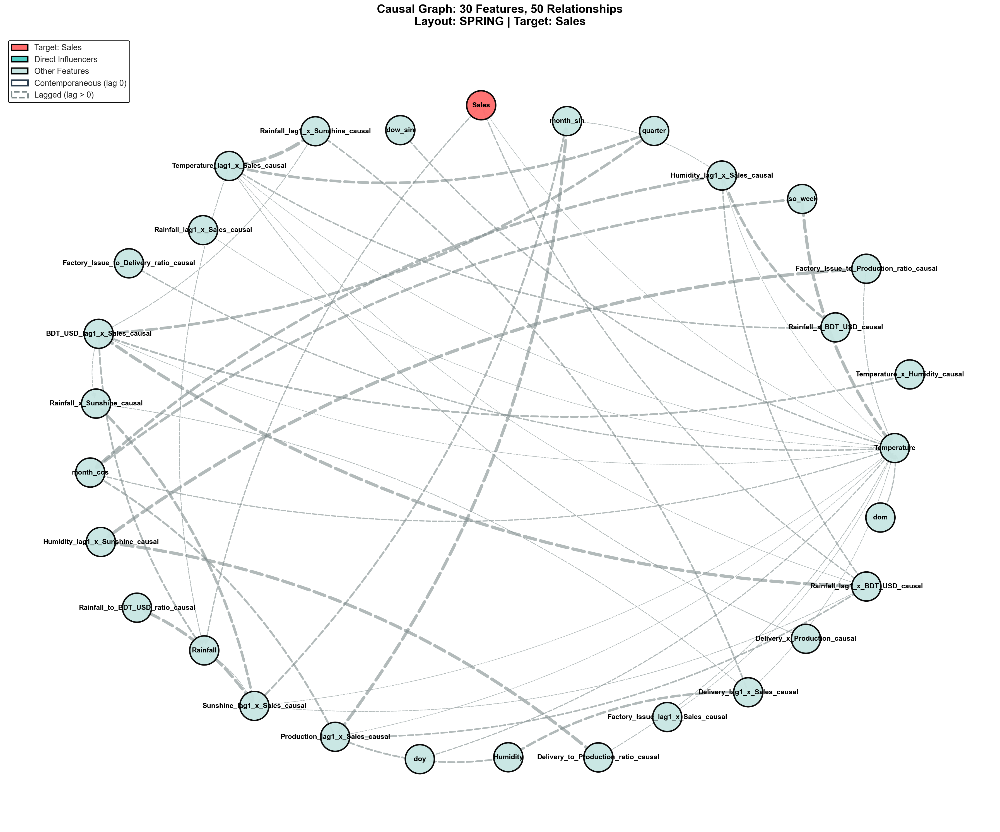

In [77]:
# ============================================================================
# 4. SPRING LAYOUT - IMPROVED (NATURAL CLUSTERING)
# ============================================================================

print("\n" + "="*80)
print("4. SPRING LAYOUT - Improved (Natural Clustering)")
print("="*80)
G4, fig4 = visualize_causal_graph_improved(
    edges_df=edges_df,
    target_col=TARGET,
    max_edges=50,
    figsize=(24, 20),
    node_size=2500,
    font_size=12,
    show_weights=True,
    layout='spring',
    theme='light'
)
plt.savefig(f'{OUTPUT_DIR}/causal_graph_spring_improved.png', dpi=150, bbox_inches='tight', facecolor='white')
print("   ✓ Saved: causal_graph_spring_improved.png")
plt.close()

Image(filename=f'{OUTPUT_DIR}/causal_graph_spring_improved.png', width=1500, height=1000)  


5. DARK THEME (For Presentations)
Visualizing 25 edges (layout: spring, theme: dark)
   Computing spring layout...
   ✓ Graph created: 19 nodes, 19 edges
   ✓ Saved: causal_graph_dark_theme.png


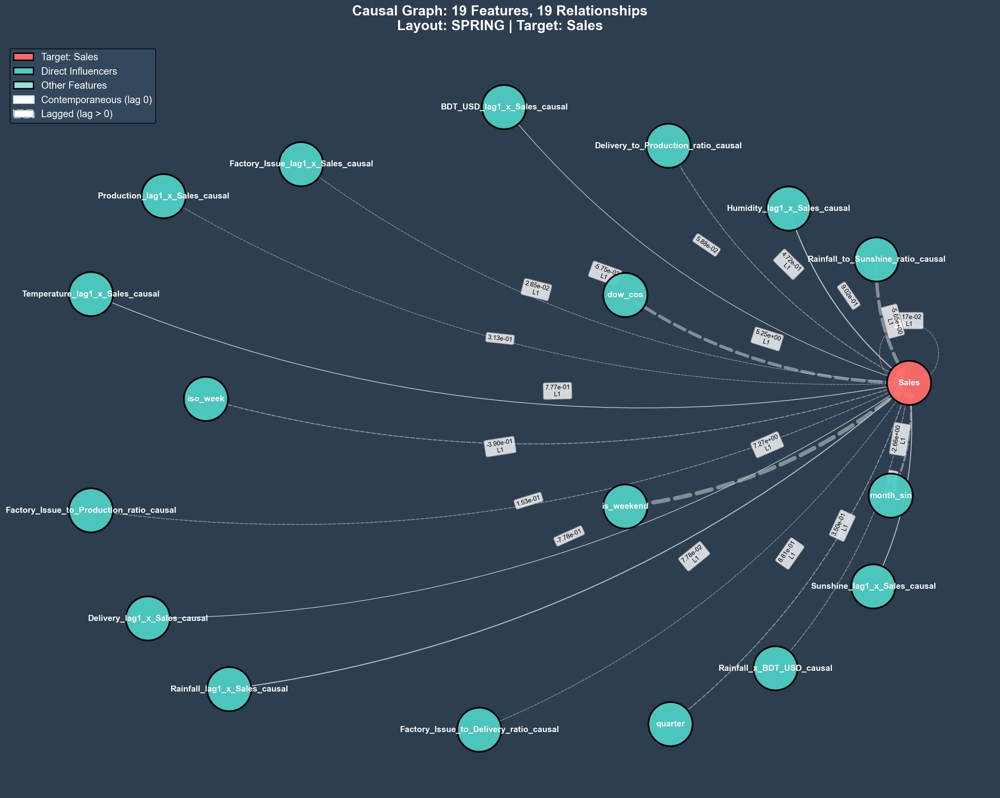

In [78]:

# ============================================================================
# 5. DARK THEME VERSION (FOR PRESENTATIONS)
# ============================================================================
print("\n" + "="*80)
print("5. DARK THEME (For Presentations)")
print("="*80)
G5, fig5 = visualize_causal_graph_improved(
    edges_df=target_edges,
    target_col=TARGET,
    max_edges=25,
    figsize=(20, 16),
    node_size=4000,
    font_size=12,
    show_weights=True,
    layout='spring',
    theme='dark'
)
plt.savefig(f'{OUTPUT_DIR}/causal_graph_dark_theme.png', dpi=150, bbox_inches='tight', facecolor='#2C3E50')
print("   ✓ Saved: causal_graph_dark_theme.png")
plt.close()

Image(filename=f'{OUTPUT_DIR}/causal_graph_dark_theme.png', width=1500, height=1000)  


6. TOP 15 - Ultra Clean (Most Readable)
Visualizing 5 edges (layout: hierarchical, theme: light)
   Computing hierarchical layout...
   ✓ Graph created: 5 nodes, 5 edges
   ✓ Saved: causal_graph_top15_clean.png


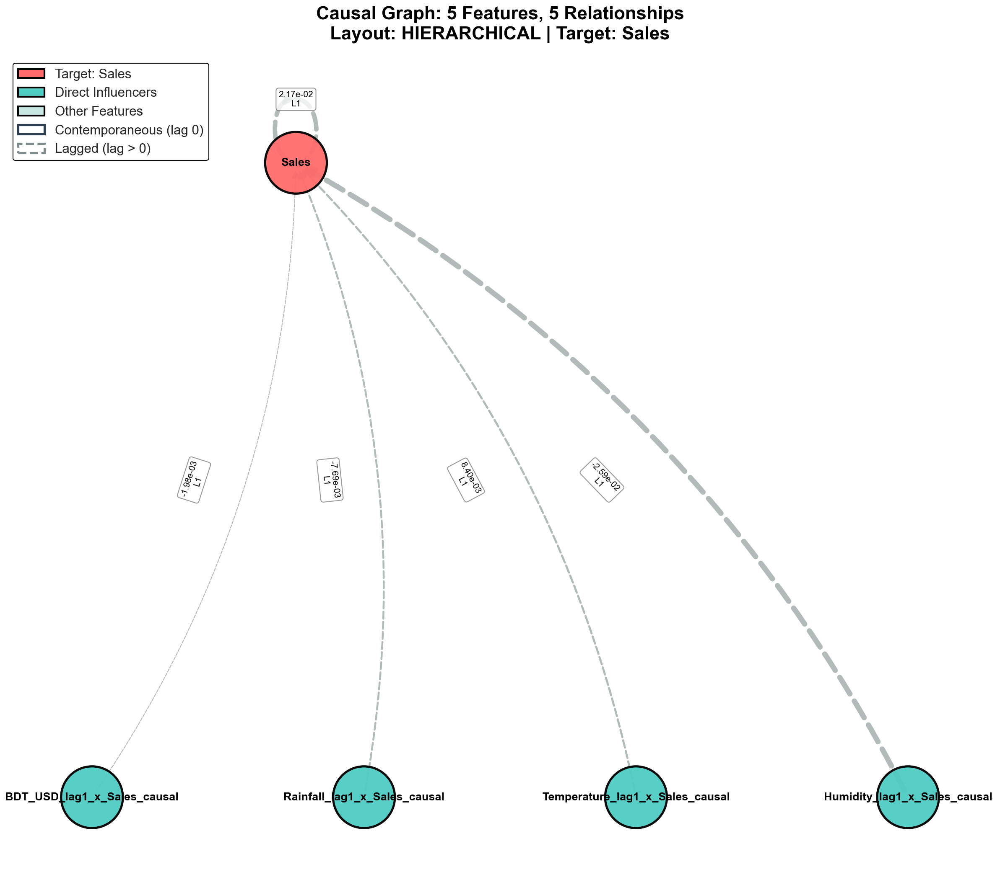

In [79]:
# ============================================================================
# 6. TOP 15 - ULTRA CLEAN (MOST READABLE)
# ============================================================================
print("\n" + "="*80)
print("6. TOP 15 - Ultra Clean (Most Readable)")
print("="*80)
G6, fig6 = visualize_causal_graph_improved(
    edges_df=target_edges,
    target_col=TARGET,
    max_edges=5,
    figsize=(16, 14),
    node_size=5000,
    font_size=13,
    show_weights=True,
    layout='hierarchical',
    theme='light'
)
plt.savefig(f'{OUTPUT_DIR}/causal_graph_top15_clean.png', dpi=150, bbox_inches='tight', facecolor='white')
print("   ✓ Saved: causal_graph_top15_clean.png")
plt.close()

Image(filename=f'{OUTPUT_DIR}/causal_graph_top15_clean.png', width=1500, height=1000)  

In [80]:
df_engineered

,Date,Sales,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD,...,is_weekend,dom,month,quarter,doy,iso_week,dow_sin,dow_cos,month_sin,month_cos
0,2023-01-01,2642.0,0.079538,0.049447,0.038181,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
1,2023-01-01,0.0,0.000000,0.000000,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
2,2023-01-01,0.0,0.000000,0.000000,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
3,2023-01-01,25.0,0.002545,0.002192,0.000000,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
4,2023-01-01,1507.0,0.053025,0.068359,0.008641,0.00000,0.380952,0.777778,0.222222,0.000000,...,1,1,1,1,1,52,-0.781831,0.623490,0.500000,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9056,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9057,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9058,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9059,2023-08-09,0.0,0.000000,0.000000,0.000000,0.06087,0.438095,0.825397,0.748792,0.976889,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000


In [81]:
TEST_SIZE_DAYS = 30 

# Keep ALL data - no dropping
df_clean = df_engineered.copy()

# Split based on date only
min_date = df_clean['Date'].min()  # 2023-01-01
max_date = df_clean['Date'].max()  # 2023-08-09
split_date = max_date - timedelta(days=TEST_SIZE_DAYS - 1)

# Split ALL data
train_df = df_clean[df_clean['Date'] < split_date].copy()
test_df = df_clean[df_clean['Date'] >= split_date].copy()

# For target columns: fill NaN with a special value or use masking
target_cols = [col for col in df_clean.columns if col.startswith('target_')]

# # Option 3a: Fill NaN targets with -1 (will be ignored during training)
# for col in target_cols:
#     train_df[col] = train_df[col].fillna(-1)
#     test_df[col] = test_df[col].fillna(-1)

# Option 3b: Create a mask to identify valid targets
# train_df['has_valid_target'] = ~train_df[f'target_{max(FORECAST_HORIZONS)}d_sum'].isna()

print(f"{'='*80}")
print(f"TRAIN-TEST SPLIT (ZERO Data Loss)")
print(f"{'='*80}")
print(f"\nData Range: {min_date.strftime('%Y-%m-%d')} to {max_date.strftime('%Y-%m-%d')}")
print(f"Split Date: {split_date.strftime('%Y-%m-%d')}")

print(f"\nTrain Set:")
print(f"  - Date range: {train_df['Date'].min().strftime('%Y-%m-%d')} to {train_df['Date'].max().strftime('%Y-%m-%d')}")
print(f"  - Shape: {train_df.shape}")
print(f"  - ALL {len(train_df):,} rows kept")

print(f"\nTest Set:")
print(f"  - Date range: {test_df['Date'].min().strftime('%Y-%m-%d')} to {test_df['Date'].max().strftime('%Y-%m-%d')}")
print(f"  - Shape: {test_df.shape}")
print(f"  - ALL {len(test_df):,} rows kept")

print(f"\nTotal: {len(df_clean):,} samples (100% data usage)")
print(f"Zero rows dropped!")
print(f"\n{'='*80}")



# Define feature columns (exclude metadata and target columns)
# exclude_cols = ['Date', 'Product', 'Sub-Group', 'has_valid_target'] + [col for col in df_clean.columns if col.startswith('target_')]
# exclude_cols = ['Date', "Sales"]  + [col for col in df_clean.columns if col.startswith('target_')] # We dont need target becuase we have already got Sales_lag_1, 2, ...
exclude_cols = ["Sales"]   # We dont need target becuase we have already got Sales_lag_1, 2, ...
feature_cols = [col for col in df_clean.columns if col not in exclude_cols]

# Fill remaining NaN with 0 (from lag features at the beginning)
train_df[feature_cols] = train_df[feature_cols].fillna(0)
test_df[feature_cols] = test_df[feature_cols].fillna(0)

print(f"Feature columns ({len(feature_cols)}):")
print(f"  First 10: {feature_cols[:10]}")
print(f"  Last 10: {feature_cols[-10:]}")

print(f"\nTarget columns ({len([col for col in df_clean.columns if col.startswith('target_')])}):")
print(f"  {[col for col in df_clean.columns if col.startswith('target_')]}")

# Prepare X and y using target_1d_sum
print(f"\n{'='*80}")
print(f"ML-READY DATASETS PREPARED (Using target_1d_sum)")
print(f"{'='*80}")

# Use target_1d_sum for training/testing
# target_col = 'target_1d_sum'
target_col = 'Sales'

X_train = train_df[feature_cols]
y_train = train_df[target_col]
X_test = test_df[feature_cols]
y_test = test_df[target_col]

print(f"\nTarget: {target_col}")
print(f"  X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"  X_test: {X_test.shape}, y_test: {y_test.shape}")


# Check for -1 values (NaN replacements)
nan_count_train = (y_train == -1).sum()
nan_count_test = (y_test == -1).sum()
print(f"\n  NaN values (marked as -1):")
print(f"    Train: {nan_count_train} ({nan_count_train/len(y_train)*100:.1f}%)")
print(f"    Test: {nan_count_test} ({nan_count_test/len(y_test)*100:.1f}%)")

print(f"\n{'='*80}")
print(f"✓ Feature engineering pipeline complete!")
print(f"  Ready to train with: X_train, y_train, X_test, y_test")
print(f"{'='*80}")

TRAIN-TEST SPLIT (ZERO Data Loss)

Data Range: 2023-01-01 to 2023-08-09
Split Date: 2023-07-11

Train Set:
  - Date range: 2023-01-01 to 2023-07-10
  - Shape: (7831, 72)
  - ALL 7,831 rows kept

Test Set:
  - Date range: 2023-07-11 to 2023-08-09
  - Shape: (1230, 72)
  - ALL 1,230 rows kept

Total: 9,061 samples (100% data usage)
Zero rows dropped!

Feature columns (71):
  First 10: ['Date', 'Production', 'Factory_Issue', 'Delivery', 'Rainfall', 'Sunshine', 'Humidity', 'Temperature', 'BDT_USD', 'Temperature_x_Humidity_causal']
  Last 10: ['is_weekend', 'dom', 'month', 'quarter', 'doy', 'iso_week', 'dow_sin', 'dow_cos', 'month_sin', 'month_cos']

Target columns (0):
  []

ML-READY DATASETS PREPARED (Using target_1d_sum)

Target: Sales
  X_train: (7831, 71), y_train: (7831,)
  X_test: (1230, 71), y_test: (1230,)

  NaN values (marked as -1):
    Train: 0 (0.0%)
    Test: 0 (0.0%)

✓ Feature engineering pipeline complete!
  Ready to train with: X_train, y_train, X_test, y_test


<br> <br> <br>

## Defining ML Metrics

In [82]:
def calculate_metrics(y_true, y_pred, model_name="Model", y_train=None):
    """Calculate comprehensive evaluation metrics including MASE"""
    mask = ~(np.isnan(y_true) | np.isnan(y_pred))
    y_true_clean = y_true[mask]
    y_pred_clean = y_pred[mask]
    
    rmse = np.sqrt(mean_squared_error(y_true_clean, y_pred_clean))
    mae = mean_absolute_error(y_true_clean, y_pred_clean)
    r2 = r2_score(y_true_clean, y_pred_clean)
    
    # MAPE calculation
    mask_nonzero = y_true_clean != 0
    if mask_nonzero.sum() > 0:
        mape = np.mean(np.abs((y_true_clean[mask_nonzero] - y_pred_clean[mask_nonzero]) / y_true_clean[mask_nonzero])) * 100
    else:
        mape = np.nan
    
    # MASE calculation
    # MASE = MAE / MAE_naive, where naive forecast is y_{t-1}
    if y_train is not None and len(y_train) > 1:
        # Use training data for scaling factor (preferred method)
        y_train_clean = y_train[~np.isnan(y_train)]
        naive_errors = np.abs(np.diff(y_train_clean))
        scale = np.mean(naive_errors)
    elif len(y_true_clean) > 1:
        # Fallback: use test data for scaling factor
        naive_errors = np.abs(np.diff(y_true_clean))
        scale = np.mean(naive_errors)
    else:
        scale = np.nan
    
    if scale > 0 and not np.isnan(scale):
        mase = mae / scale
    else:
        mase = np.nan
    
    return {
        'Model': model_name,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'MASE': mase,
        'R²': r2,
        'N_samples': len(y_true_clean)
    }


def prepare_sequences_for_lstm(df, feature_cols, target_col, lookback=1):
    """Prepare sequences for LSTM training (works for both TF and PyTorch)"""
    X_sequences = []
    y_targets = []
    
    for product in df['Product'].unique():
        product_data = df[df['Product'] == product].sort_values('Date').reset_index(drop=True)
        
        # Use the passed feature_cols (which now includes encoded features)
        # Make sure these columns exist in product_data
        available_features = [col for col in feature_cols if col in product_data.columns]
        
        if len(available_features) == 0:
            print(f"Warning: No features found for product {product}")
            continue
            
        features = product_data[available_features].values
        targets = product_data[target_col].values
        
        for i in range(lookback, len(product_data)):
            # Skip if target is -1 (NaN marker)
            if targets[i] == -1 or np.isnan(targets[i]):
                continue
                
            X_sequences.append(features[i-lookback:i])
            y_targets.append(targets[i])
    
    if len(X_sequences) == 0:
        raise ValueError(f"No valid sequences created for target {target_col}. All targets may be NaN.")
    
    return np.array(X_sequences), np.array(y_targets)


def print_metrics_summary(metrics_dict):
    """Print metrics in formatted way"""
    print(f"{metrics_dict['Model']:35s} | RMSE: {metrics_dict['RMSE']:>8,.0f} | MAE: {metrics_dict['MAE']:>8,.0f} | MAPE: {metrics_dict['MAPE']:>6.2f}% | MASE: {metrics_dict['MASE']:>6.3f} | R²: {metrics_dict['R²']:>6.4f}")

print("✓ Helper functions defined")

✓ Helper functions defined


In [83]:
X_train.drop(columns=["Date"], inplace=True)
X_test.drop(columns=["Date"], inplace=True)

<br> <br> <br>

## Training Machine Learning Models

In [84]:
# Dictionary to store models and results
# X_train.drop(columns=["Date"], inplace=True)
# X_test.drop(columns=["Date"], inplace=True)

models = {}
predictions = {}
metrics_results = []

print("="*80)
print("TRAINING MULTIPLE MODELS")
print("="*80)

# 1. Random Forest
print("\n1. Training Random Forest...")
rf_model = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=2,
    random_state=42,
    n_jobs=-1
)

rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)

models['RandomForest'] = rf_model
predictions['RandomForest'] = rf_pred

rf_metrics = calculate_metrics(y_test, rf_pred, "RandomForest", y_train=y_train)
metrics_results.append(rf_metrics)
print_metrics_summary(rf_metrics)

# 2. XGBoost
print("\n2. Training XGBoost...")
xgb_model = xgb.XGBRegressor(
    n_estimators=500, 
    learning_rate=0.05, 
    max_depth=6,
    subsample=0.8, 
    colsample_bytree=0.8, 
    min_child_weight=3,
    reg_alpha=0.1, 
    reg_lambda=1.0, 
    random_state=42,
    n_jobs=-1, 
    tree_method='hist'
)

xgb_model.fit(X_train, y_train, verbose=False)
xgb_pred = xgb_model.predict(X_test)

models['XGBoost'] = xgb_model
predictions['XGBoost'] = xgb_pred

xgb_metrics = calculate_metrics(y_test, xgb_pred, "XGBoost", y_train=y_train)
metrics_results.append(xgb_metrics)
print_metrics_summary(xgb_metrics)

# 3. LightGBM
print("\n3. Training LightGBM...")
lgb_model = lgb.LGBMRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    min_child_weight=3,
    reg_alpha=0.1,
    reg_lambda=1.0,
    random_state=42,
    n_jobs=-1,
    verbosity=-1
)

lgb_model.fit(X_train, y_train)
lgb_pred = lgb_model.predict(X_test)

models['LightGBM'] = lgb_model
predictions['LightGBM'] = lgb_pred

lgb_metrics = calculate_metrics(y_test, lgb_pred, "LightGBM", y_train=y_train)
metrics_results.append(lgb_metrics)
print_metrics_summary(lgb_metrics)

# 4. CatBoost
print("\n4. Training CatBoost...")
cat_model = CatBoostRegressor(
    iterations=500,
    learning_rate=0.05,
    depth=6,
    subsample=0.8,
    colsample_bylevel=0.8,
    random_state=42,
    verbose=False
)

cat_model.fit(X_train, y_train)
cat_pred = cat_model.predict(X_test)

models['CatBoost'] = cat_model
predictions['CatBoost'] = cat_pred

cat_metrics = calculate_metrics(y_test, cat_pred, "CatBoost", y_train=y_train)
metrics_results.append(cat_metrics)
print_metrics_summary(cat_metrics)

# Summary comparison
print("\n" + "="*80)
print("MODEL COMPARISON SUMMARY")
print("="*80)

# Create summary dataframe
summary_df = pd.DataFrame(metrics_results)
print(summary_df.to_string(index=False))

# Find best model for each metric
print("\n" + "="*80)
print("BEST MODELS BY METRIC")
print("="*80)

# Define metrics and their optimization direction (lower is better or higher is better)
metric_config = {
    'RMSE': 'min',
    'MAE': 'min',
    'MAPE': 'min',
    'MASE': 'min',
    'R²': 'max',
    'SMAPE': 'min'
}

best_models = {}

for metric, direction in metric_config.items():
    if metric in summary_df.columns:
        if direction == 'min':
            best_idx = summary_df[metric].idxmin()
            best_value = summary_df[metric].min()
        else:  # max
            best_idx = summary_df[metric].idxmax()
            best_value = summary_df[metric].max()
        
        best_model_name = summary_df.loc[best_idx, 'Model']
        best_models[metric] = {
            'model': best_model_name,
            'value': best_value
        }
        
        print(f"  {metric:8s}: {best_model_name:15s} ({best_value:.4f})")

# Overall best model (by RMSE as primary metric)
overall_best = best_models['RMSE']['model']
print(f"\n✓ Overall best model (by RMSE): {overall_best}")

print("\n✓ All models trained successfully!")

TRAINING MULTIPLE MODELS

1. Training Random Forest...
RandomForest                        | RMSE:      124 | MAE:       32 | MAPE:   7.97% | MASE:  0.022 | R²: 0.9946

2. Training XGBoost...
XGBoost                             | RMSE:       79 | MAE:       24 | MAPE:  11.87% | MASE:  0.017 | R²: 0.9979

3. Training LightGBM...
LightGBM                            | RMSE:      118 | MAE:       41 | MAPE:  23.58% | MASE:  0.029 | R²: 0.9952

4. Training CatBoost...
CatBoost                            | RMSE:      103 | MAE:       40 | MAPE:  37.47% | MASE:  0.028 | R²: 0.9964

MODEL COMPARISON SUMMARY
       Model       RMSE       MAE      MAPE     MASE       R²  N_samples
RandomForest 124.366970 32.139114  7.970717 0.022328 0.994640       1230
     XGBoost  78.692805 23.769652 11.874500 0.016514 0.997854       1230
    LightGBM 117.856458 41.415953 23.584060 0.028773 0.995186       1230
    CatBoost 102.585259 40.425356 37.466834 0.028085 0.996353       1230

BEST MODELS BY METRIC
  RMS

<br> <br> <br>

## Saving the Models

In [85]:
import pickle
import joblib
from pathlib import Path

# Create models directory if it doesn't exist
models_dir = Path('../models')
models_dir.mkdir(parents=True, exist_ok=True)

print("\n" + "="*80)
print("SAVING MODELS")
print("="*80)

# Save each model with appropriate format
for model_name, model in models.items():
    print(f"\nSaving {model_name}...")
    
    # Define file paths
    model_path = models_dir / f"{model_name.lower()}_model"
    
    try:
        # Save using model-specific methods for better compatibility
        if model_name == 'CatBoost':
            # CatBoost has its own save format (.cbm)
            model.save_model(str(model_path) + '.cbm')
            print(f"  ✓ Saved as: {model_path}.cbm")
            
        elif model_name == 'XGBoost':
            # XGBoost can save in JSON or binary format
            model.save_model(str(model_path) + '.json')
            print(f"  ✓ Saved as: {model_path}.json")
            
        elif model_name == 'LightGBM':
            # LightGBM has its own text format
            model.booster_.save_model(str(model_path) + '.txt')
            print(f"  ✓ Saved as: {model_path}.txt")
            
        else:
            # For scikit-learn models (RandomForest, etc.), use joblib
            joblib.dump(model, str(model_path) + '.pkl')
            print(f"  ✓ Saved as: {model_path}.pkl")
            
    except Exception as e:
        print(f"  ✗ Error saving {model_name}: {e}")
        # Fallback to pickle if native format fails
        try:
            with open(str(model_path) + '.pkl', 'wb') as f:
                pickle.dump(model, f)
            print(f"  ✓ Saved as pickle: {model_path}.pkl")
        except Exception as e2:
            print(f"  ✗ Pickle save also failed: {e2}")

# Save best models metadata
best_models_info = {
    'best_models_by_metric': best_models,
    'overall_best': overall_best,
    'training_date': pd.Timestamp.now().isoformat(),
    'model_files': {
        'RandomForest': 'randomforest_model.pkl',
        'XGBoost': 'xgboost_model.json',
        'LightGBM': 'lightgbm_model.txt',
        'CatBoost': 'catboost_model.cbm'
    }
}

# Save metadata as JSON
metadata_path = models_dir / 'best_models_metadata.json'
with open(metadata_path, 'w') as f:
    import json
    json.dump(best_models_info, f, indent=2, default=str)
print(f"\n✓ Saved best models metadata: {metadata_path}")

# Save summary dataframe
summary_path = models_dir / 'model_comparison_summary.csv'
summary_df.to_csv(summary_path, index=False)
print(f"✓ Saved comparison summary: {summary_path}")

print("\n" + "="*80)
print("✓ All models saved successfully!")
print("="*80)


SAVING MODELS

Saving RandomForest...
  ✓ Saved as: ..\models\randomforest_model.pkl

Saving XGBoost...
  ✓ Saved as: ..\models\xgboost_model.json

Saving LightGBM...
  ✓ Saved as: ..\models\lightgbm_model.txt

Saving CatBoost...
  ✓ Saved as: ..\models\catboost_model.cbm

✓ Saved best models metadata: ..\models\best_models_metadata.json
✓ Saved comparison summary: ..\models\model_comparison_summary.csv

✓ All models saved successfully!


<br> <br> <br> 

## Loading the Models

In [86]:
# Load CatBoost
from catboost import CatBoostRegressor
cat_model = CatBoostRegressor()
cat_model.load_model('../models/catboost_model.cbm')

# Load XGBoost
import xgboost as xgb
xgb_model = xgb.XGBRegressor()
xgb_model.load_model('../models/xgboost_model.json')

# Load LightGBM
import lightgbm as lgb
lgb_model = lgb.Booster(model_file='../models/lightgbm_model.txt')

# Load RandomForest
import joblib
rf_model = joblib.load('../models/randomforest_model.pkl')

<br> <br> <br>

### Feature Importance

In [87]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostRegressor

# For explainability
try:
    import lime
    import lime.lime_tabular
    LIME_AVAILABLE = True
except ImportError:
    LIME_AVAILABLE = False
    print("LIME not available. Install with: pip install lime")

try:
    import shap
    SHAP_AVAILABLE = True
except ImportError:
    SHAP_AVAILABLE = False
    print("SHAP not available. Install with: pip install shap")

def explain_model_predictions(X_test, y_test, ml_model, n_samples=5, top_n=10, xai_method='SHAP'):
    """
    Explain model predictions using LIME or SHAP on randomly selected test samples.
    
    Parameters:
    -----------
    X_test : pd.DataFrame
        Test features
    y_test : pd.Series or np.array
        Test targets
    ml_model : trained model
        The ML model to explain (RandomForest, XGBoost, LightGBM, CatBoost)
    n_samples : int, default=5
        Number of random samples from X_test to explain
    top_n : int, default=10
        Number of top features to show in explanation
    xai_method : str, default='SHAP'
        Explanation method: 'LIME' or 'SHAP'
    
    Returns:
    --------
    pd.DataFrame
        DataFrame with columns ['feature_name', 'feature_importance']
        Contains aggregated feature importance across all explained samples
    """
    
    if xai_method.upper() not in ['LIME', 'SHAP']:
        raise ValueError("xai_method must be 'LIME' or 'SHAP'")
    
    if xai_method.upper() == 'LIME' and not LIME_AVAILABLE:
        raise ImportError("LIME is not installed. Install with: pip install lime")
    
    if xai_method.upper() == 'SHAP' and not SHAP_AVAILABLE:
        raise ImportError("SHAP is not installed. Install with: pip install shap")
    
    # Randomly select n samples
    np.random.seed(42)
    sample_indices = np.random.choice(len(X_test), size=min(n_samples, len(X_test)), replace=False)
    X_samples = X_test.iloc[sample_indices]
    
    print(f"Explaining {len(sample_indices)} random samples using {xai_method.upper()}")
    print(f"Showing top {top_n} features per sample")
    print("="*80)
    
    all_feature_importances = {}
    
    if xai_method.upper() == 'LIME':
        # LIME explanation
        explainer = lime.lime_tabular.LimeTabularExplainer(
            training_data=X_test.values,
            feature_names=X_test.columns.tolist(),
            mode='regression',
            random_state=42
        )
        
        for i, idx in enumerate(sample_indices):
            sample = X_samples.iloc[i:i+1]
            
            # Get LIME explanation
            exp = explainer.explain_instance(
                sample.values[0], 
                ml_model.predict, 
                num_features=top_n
            )
            
            # Collect feature importances
            for feature, importance in exp.as_list():
                if feature not in all_feature_importances:
                    all_feature_importances[feature] = []
                all_feature_importances[feature].append(importance)
            
            if i < 3:  # Print details for first 3 samples
                print(f"\nSample {i+1} (Index {idx}) - Top {top_n} features:")
                for feature, importance in exp.as_list():
                    print(f"  {feature}: {importance:.4f}")
    
    elif xai_method.upper() == 'SHAP':
        # SHAP explanation
        if isinstance(ml_model, (RandomForestRegressor, xgb.XGBRegressor, lgb.LGBMRegressor)):
            explainer = shap.TreeExplainer(ml_model)
        elif isinstance(ml_model, CatBoostRegressor):
            explainer = shap.TreeExplainer(ml_model)
        else:
            # For other models, use KernelExplainer (slower)
            background = X_test.sample(min(100, len(X_test)), random_state=42)
            explainer = shap.KernelExplainer(ml_model.predict, background.values)
        
        # Get SHAP values for samples
        shap_values = explainer.shap_values(X_samples.values)
        
        if isinstance(shap_values, list):
            shap_values = shap_values[0]  # For multi-output models
        
        for i, idx in enumerate(sample_indices):
            sample_shap = shap_values[i]
            
            # Get top_n features by absolute SHAP value
            feature_shap = list(zip(X_test.columns, sample_shap))
            top_features = sorted(feature_shap, key=lambda x: abs(x[1]), reverse=True)[:top_n]
            
            # Collect feature importances
            for feature, shap_val in top_features:
                if feature not in all_feature_importances:
                    all_feature_importances[feature] = []
                all_feature_importances[feature].append(shap_val)
            
            if i < 3:  # Print details for first 3 samples
                print(f"\nSample {i+1} (Index {idx}) - Top {top_n} features:")
                for feature, shap_val in top_features:
                    print(f"  {feature}: {shap_val:.4f}")
    
    # Aggregate feature importances (mean across samples)
    aggregated_importances = {}
    for feature, importances in all_feature_importances.items():
        aggregated_importances[feature] = np.mean(importances)
    
    # Create DataFrame with top features
    importance_df = pd.DataFrame(
        list(aggregated_importances.items()),
        columns=['feature_name', 'feature_importance']
    ).sort_values('feature_importance', key=abs, ascending=False)
    
    print(f"\n{'='*80}")
    print(f"AGGREGATED FEATURE IMPORTANCE (Mean across {len(sample_indices)} samples)")
    print(f"{'='*80}")
    print(importance_df.head(20).to_string(index=False))
    
    return importance_df, X_samples

In [101]:
def visualize_feature_importance(importance_df, top_n=20):
    """
    Visualize feature importance from a DataFrame.
    
    Parameters:
    -----------
    importance_df : pd.DataFrame
        DataFrame with columns 'feature_name' and 'feature_importance'
    top_n : int, default=20
        Number of top features to display in the main chart
    
    Returns:
    --------
    tuple : (fig1, fig2)
        Two matplotlib figure objects
    """
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    # Set style
    sns.set_style("whitegrid")
    
    # Figure 1: Main horizontal bar chart
    fig1, ax = plt.subplots(figsize=(12, 8))
    
    top_features = importance_df.head(top_n)
    colors = ['#1f77b4' if x >= 0 else '#d62728' for x in top_features['feature_importance']]
    
    ax.barh(range(len(top_features)), top_features['feature_importance'], color=colors)
    ax.set_yticks(range(len(top_features)))
    ax.set_yticklabels(top_features['feature_name'])
    ax.set_xlabel('Feature Importance (Mean SHAP Value)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Feature Name', fontsize=12, fontweight='bold')
    ax.set_title(f'Top {top_n} Features by Importance', fontsize=14, fontweight='bold')
    ax.axvline(x=0, color='black', linestyle='-', linewidth=0.8)
    ax.invert_yaxis()  # Highest importance at top
    fig1.tight_layout()
    
    # Figure 2: Split view - positive and negative contributors
    fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 10))
    
    # Top positive contributors
    positive_features = importance_df[importance_df['feature_importance'] > 0]
    if not positive_features.empty:
        ax1.barh(range(len(positive_features)), positive_features['feature_importance'], color='#2ecc71')
        ax1.set_yticks(range(len(positive_features)))
        ax1.set_yticklabels(positive_features['feature_name'])
        ax1.set_xlabel('Feature Importance', fontsize=11, fontweight='bold')
        ax1.set_title(f'Top Positive Contributors', fontsize=12, fontweight='bold')
        ax1.invert_yaxis()
    
    # Top negative contributors
    negative_features = importance_df[importance_df['feature_importance'] < 0]
    if not negative_features.empty:
        ax2.barh(range(len(negative_features)), negative_features['feature_importance'], color='#e74c3c')
        ax2.set_yticks(range(len(negative_features)))
        ax2.set_yticklabels(negative_features['feature_name'])
        ax2.set_xlabel('Feature Importance', fontsize=11, fontweight='bold')
        ax2.set_title(f'Top Negative Contributors', fontsize=12, fontweight='bold')
        ax2.invert_yaxis()
    
    fig2.tight_layout()
    
    # Print summary statistics
    print(f"\n{'='*80}")
    print("FEATURE IMPORTANCE SUMMARY")
    print(f"{'='*80}")
    print(f"Total features: {len(importance_df)}")
    print(f"Positive contributors: {len(importance_df[importance_df['feature_importance'] > 0])}")
    print(f"Negative contributors: {len(importance_df[importance_df['feature_importance'] < 0])}")
    print(f"Mean importance: {importance_df['feature_importance'].mean():.4f}")
    print(f"Std importance: {importance_df['feature_importance'].std():.4f}")
    print(f"Max importance: {importance_df['feature_importance'].max():.4f}")
    print(f"Min importance: {importance_df['feature_importance'].min():.4f}")
    
    plt.show()
    
    return fig1, fig2

In [89]:
X_test

,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD,Temperature_x_Humidity_causal,Humidity_x_Sunshine_causal,...,is_weekend,dom,month,quarter,doy,iso_week,dow_sin,dow_cos,month_sin,month_cos
7831,0.000000,0.000000,0.000000,0.026087,0.000000,0.698413,0.821256,0.897891,0.573576,0.000000,...,0,11,7,3,192,28,0.781831,0.623490,-0.500000,-0.866025
7832,0.212418,0.149411,0.187233,0.026087,0.000000,0.698413,0.821256,0.897891,0.573576,0.000000,...,0,11,7,3,192,28,0.781831,0.623490,-0.500000,-0.866025
7833,0.042208,0.057858,0.053896,0.026087,0.000000,0.698413,0.821256,0.897891,0.573576,0.000000,...,0,11,7,3,192,28,0.781831,0.623490,-0.500000,-0.866025
7834,0.026778,0.013050,0.012475,0.026087,0.000000,0.698413,0.821256,0.897891,0.573576,0.000000,...,0,11,7,3,192,28,0.781831,0.623490,-0.500000,-0.866025
7835,0.026566,0.025743,0.023492,0.026087,0.000000,0.698413,0.821256,0.897891,0.573576,0.000000,...,0,11,7,3,192,28,0.781831,0.623490,-0.500000,-0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9056,0.000000,0.000000,0.000000,0.060870,0.438095,0.825397,0.748792,0.976889,0.618051,0.361602,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9057,0.000000,0.000000,0.000000,0.060870,0.438095,0.825397,0.748792,0.976889,0.618051,0.361602,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9058,0.000000,0.000000,0.000000,0.060870,0.438095,0.825397,0.748792,0.976889,0.618051,0.361602,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000
9059,0.000000,0.000000,0.000000,0.060870,0.438095,0.825397,0.748792,0.976889,0.618051,0.361602,...,0,9,8,3,221,32,0.974928,-0.222521,-0.866025,-0.500000


In [90]:
models

{'RandomForest': RandomForestRegressor(max_depth=10, min_samples_leaf=2, min_samples_split=5,
                       n_jobs=-1, random_state=42),
 'XGBoost': XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=3, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=500,
              n_jobs=-1, num_parallel_tree=None, ...),
 'LightGBM': LGBMRegressor(colsample_bytree=0.8, learning_rate=0.05, max_depth=6,
         

In [91]:
# Usage example:

top_n = 10

# Assuming you have trained models and X_test, y_test
importance_df, X_sample = explain_model_predictions(
    X_test=X_test,
    y_test=y_test,
    ml_model=models['CatBoost'],  # or models['XGBoost'], etc.
    n_samples=1,
    top_n=top_n,
    xai_method='SHAP'  # or 'LIME'
)

# The returned DataFrame has columns: 'feature_name', 'feature_importance'
display(importance_df)
display(X_sample)







Explaining 1 random samples using SHAP
Showing top 10 features per sample

Sample 1 (Index 548) - Top 10 features:
  Temperature_lag1_x_Sales_causal: 374.8698
  Humidity_lag1_x_Sales_causal: 200.8988
  BDT_USD_lag1_x_Sales_causal: 111.3400
  Humidity_lag1_x_Sunshine_causal: 36.6561
  Production: 30.4285
  Temperature_x_Humidity_causal: -29.8322
  Temperature_weighted_to_Sales_lag1: -29.1319
  Production_weighted_to_Sales_lag1: 28.9177
  Temperature_lag1_x_Humidity_causal: -28.5124
  doy: -24.3765

AGGREGATED FEATURE IMPORTANCE (Mean across 1 samples)
                      feature_name  feature_importance
   Temperature_lag1_x_Sales_causal          374.869847
      Humidity_lag1_x_Sales_causal          200.898785
       BDT_USD_lag1_x_Sales_causal          111.340048
   Humidity_lag1_x_Sunshine_causal           36.656066
                        Production           30.428518
     Temperature_x_Humidity_causal          -29.832214
Temperature_weighted_to_Sales_lag1          -29.131883
 Pr

,feature_name,feature_importance
0,Temperature_lag1_x_Sales_causal,374.869847
1,Humidity_lag1_x_Sales_causal,200.898785
2,BDT_USD_lag1_x_Sales_causal,111.340048
3,Humidity_lag1_x_Sunshine_causal,36.656066
4,Production,30.428518
5,Temperature_x_Humidity_causal,-29.832214
6,Temperature_weighted_to_Sales_lag1,-29.131883
7,Production_weighted_to_Sales_lag1,28.917706
8,Temperature_lag1_x_Humidity_causal,-28.512442
9,doy,-24.376451


,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD,Temperature_x_Humidity_causal,Humidity_x_Sunshine_causal,...,is_weekend,dom,month,quarter,doy,iso_week,dow_sin,dow_cos,month_sin,month_cos
8379,0.053025,0.053117,0.028568,0.0,0.371429,0.52381,0.908213,0.823439,0.47573,0.194558,...,0,24,7,3,205,30,0.0,1.0,-0.5,-0.866025



FEATURE IMPORTANCE SUMMARY
Total features: 10
Positive contributors: 6
Negative contributors: 4
Mean importance: 67.1258
Std importance: 131.0120
Max importance: 374.8698
Min importance: -29.8322


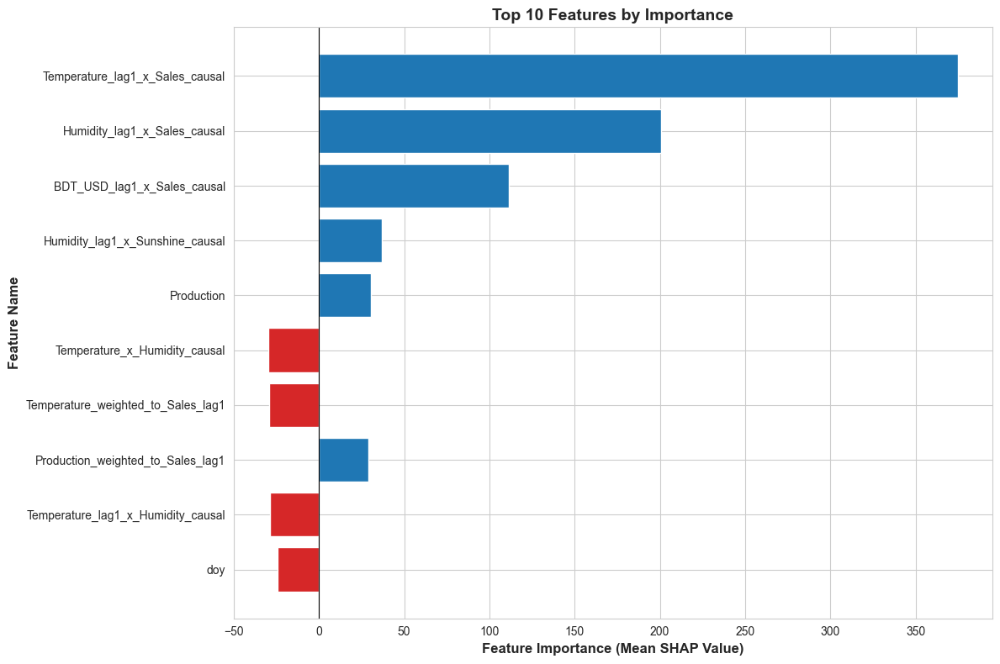

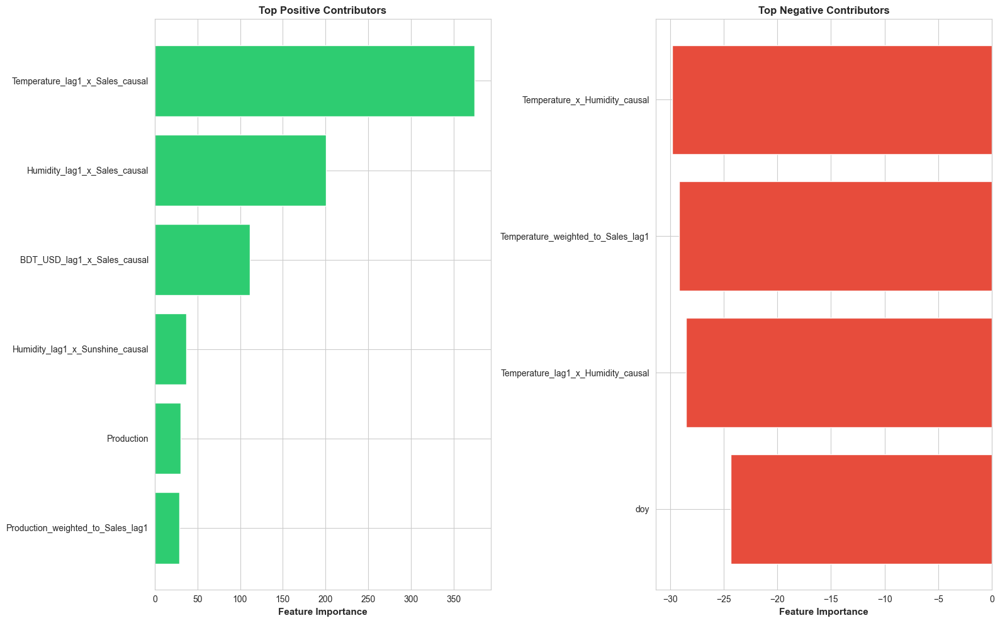

In [102]:
# Visualize feature importance
fig1, fig2 = visualize_feature_importance(importance_df, top_n=top_n)

In [93]:
X_sample

,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD,Temperature_x_Humidity_causal,Humidity_x_Sunshine_causal,...,is_weekend,dom,month,quarter,doy,iso_week,dow_sin,dow_cos,month_sin,month_cos
8379,0.053025,0.053117,0.028568,0.0,0.371429,0.52381,0.908213,0.823439,0.47573,0.194558,...,0,24,7,3,205,30,0.0,1.0,-0.5,-0.866025


In [94]:
X_sample

,Production,Factory_Issue,Delivery,Rainfall,Sunshine,Humidity,Temperature,BDT_USD,Temperature_x_Humidity_causal,Humidity_x_Sunshine_causal,...,is_weekend,dom,month,quarter,doy,iso_week,dow_sin,dow_cos,month_sin,month_cos
8379,0.053025,0.053117,0.028568,0.0,0.371429,0.52381,0.908213,0.823439,0.47573,0.194558,...,0,24,7,3,205,30,0.0,1.0,-0.5,-0.866025


In [95]:
y_test.loc[X_sample.index]

8379    1416.0
Name: Sales, dtype: float64

In [114]:
import pandas as pd
import numpy as np
from typing import Dict, List, Tuple
import matplotlib.pyplot as plt
import seaborn as sns

def counterfactual_feature_importance_detailed(
    X_sample: pd.DataFrame,
    y_true: pd.Series,
    model,
    perturbation_method: str = 'percentile',
    percentiles: List[float] = [10, 25, 50, 75, 90],
    n_steps: int = 20
) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Perform detailed counterfactual analysis showing how value changes affect predictions.
    
    Parameters:
    -----------
    X_sample : pd.DataFrame
        Sample data to perform counterfactual analysis on
    y_true : pd.Series
        True target values corresponding to X_sample
    model : trained model
        Model with predict() method
    perturbation_method : str
        Method to perturb features
    percentiles : List[float]
        Percentiles to use for perturbation
    n_steps : int
        Number of perturbation steps
    
    Returns:
    --------
    Tuple of:
        - feature_importance_df: Overall feature importance ranking
        - detailed_changes_df: Detailed changes for each feature showing what makes predictions worse
        - sample_level_df: Changes for each sample in X_sample
    """
    
    # Get original predictions
    y_pred_original = model.predict(X_sample)
    
    # Calculate original errors
    original_errors = np.abs(y_true.values - y_pred_original)
    
    # Store results
    feature_impacts = []
    detailed_changes = []
    sample_level_impacts = []
    
    print("="*80)
    print("DETAILED COUNTERFACTUAL ANALYSIS - TRACKING PREDICTION WORSENING")
    print("="*80)
    print(f"Sample size: {len(X_sample)}")
    print(f"Original predictions range: [{y_pred_original.min():.2f}, {y_pred_original.max():.2f}]")
    print(f"True values range: [{y_true.values.min():.2f}, {y_true.values.max():.2f}]")
    print(f"Original errors (MAE): {original_errors.mean():.2f}")
    print(f"\nAnalyzing {len(X_sample.columns)} features...")
    print("="*80)
    
    # Iterate through each feature
    for idx, feature in enumerate(X_sample.columns, 1):
        print(f"\r[{idx}/{len(X_sample.columns)}] Analyzing: {feature[:50]}", end="", flush=True)
        
        # Get original feature values
        original_values = X_sample[feature].values
        
        # Determine perturbation values
        if perturbation_method == 'percentile':
            if len(np.unique(original_values)) > 1:
                perturbation_values = np.percentile(original_values, percentiles)
            else:
                perturbation_values = original_values[0] + np.linspace(-0.1, 0.1, len(percentiles))
                
        elif perturbation_method == 'range':
            min_val = original_values.min()
            max_val = original_values.max()
            if min_val != max_val:
                perturbation_values = np.linspace(min_val, max_val, n_steps)
            else:
                perturbation_values = min_val + np.linspace(-0.1, 0.1, n_steps)
                
        elif perturbation_method == 'std':
            mean_val = original_values.mean()
            std_val = original_values.std()
            if std_val > 0:
                perturbation_values = mean_val + np.linspace(-3*std_val, 3*std_val, n_steps)
            else:
                perturbation_values = mean_val + np.linspace(-0.1, 0.1, n_steps)
        
        # Track changes for this feature
        feature_worsening_count = 0
        feature_improving_count = 0
        max_error_increase = 0
        max_error_decrease = 0
        worst_perturbation_value = None
        best_perturbation_value = None
        
        all_prediction_changes = []
        all_error_changes = []
        
        # Perform counterfactual analysis for each perturbation value
        for perturb_value in perturbation_values:
            # Create counterfactual sample
            X_counterfactual = X_sample.copy()
            X_counterfactual[feature] = perturb_value
            
            # Get counterfactual predictions
            y_pred_counterfactual = model.predict(X_counterfactual)
            
            # Calculate new errors
            new_errors = np.abs(y_true.values - y_pred_counterfactual)
            
            # Calculate changes
            pred_change = y_pred_counterfactual - y_pred_original
            error_change = new_errors - original_errors
            
            # Track for each sample
            for sample_idx in range(len(X_sample)):
                sample_level_impacts.append({
                    'sample_index': X_sample.index[sample_idx],
                    'feature_name': feature,
                    'original_value': original_values[sample_idx],
                    'perturbed_value': perturb_value,
                    'value_change': perturb_value - original_values[sample_idx],
                    'original_prediction': y_pred_original[sample_idx],
                    'new_prediction': y_pred_counterfactual[sample_idx],
                    'prediction_change': pred_change[sample_idx],
                    'true_value': y_true.values[sample_idx],
                    'original_error': original_errors[sample_idx],
                    'new_error': new_errors[sample_idx],
                    'error_change': error_change[sample_idx],
                    'prediction_worsened': error_change[sample_idx] > 0
                })
            
            # Aggregate statistics
            mean_error_change = error_change.mean()
            all_prediction_changes.append(np.abs(pred_change).mean())
            all_error_changes.append(mean_error_change)
            
            # Count worsening vs improving
            worsening_samples = (error_change > 0).sum()
            improving_samples = (error_change < 0).sum()
            
            feature_worsening_count += worsening_samples
            feature_improving_count += improving_samples
            
            # Track worst and best perturbations
            if mean_error_change > max_error_increase:
                max_error_increase = mean_error_change
                worst_perturbation_value = perturb_value
            
            if mean_error_change < max_error_decrease:
                max_error_decrease = mean_error_change
                best_perturbation_value = perturb_value
            
            # Store detailed change info
            detailed_changes.append({
                'feature_name': feature,
                'original_value_mean': original_values.mean(),
                'perturbed_value': perturb_value,
                'value_change': perturb_value - original_values.mean(),
                'value_change_pct': ((perturb_value - original_values.mean()) / (original_values.mean() + 1e-10)) * 100,
                'mean_prediction_change': pred_change.mean(),
                'mean_abs_prediction_change': np.abs(pred_change).mean(),
                'mean_error_change': mean_error_change,
                'worsening_samples': worsening_samples,
                'improving_samples': improving_samples,
                'worsening_ratio': worsening_samples / len(X_sample)
            })
        
        # Aggregate feature-level metrics
        feature_impacts.append({
            'feature_name': feature,
            'mean_abs_prediction_change': np.mean(all_prediction_changes),
            'max_abs_prediction_change': np.max(all_prediction_changes),
            'mean_error_change': np.mean(all_error_changes),
            'max_error_increase': max_error_increase,
            'max_error_decrease': max_error_decrease,
            'worst_perturbation_value': worst_perturbation_value,
            'best_perturbation_value': best_perturbation_value,
            'original_value_mean': original_values.mean(),
            'original_value_std': original_values.std(),
            'total_worsening_count': feature_worsening_count,
            'total_improving_count': feature_improving_count,
            'worsening_ratio': feature_worsening_count / (len(perturbation_values) * len(X_sample)),
            'n_perturbations': len(perturbation_values)
        })
    
    print("\n" + "="*80)
    
    # Create results DataFrames
    feature_importance_df = pd.DataFrame(feature_impacts)
    detailed_changes_df = pd.DataFrame(detailed_changes)
    sample_level_df = pd.DataFrame(sample_level_impacts)
    
    # Sort by error increase (features that worsen predictions the most)
    feature_importance_df = feature_importance_df.sort_values('max_error_increase', ascending=False)
    feature_importance_df.insert(0, 'rank', range(1, len(feature_importance_df) + 1))
    
    return feature_importance_df, detailed_changes_df, sample_level_df


def visualize_prediction_worsening(
    feature_importance_df: pd.DataFrame,
    detailed_changes_df: pd.DataFrame,
    top_n: int = 15,
    figure = plt.figure(figsize=(20, 12))
) -> None:
    """
    Visualize which feature changes worsen predictions the most.
    """
    
    sns.set_style("whitegrid")
    # fig = plt.figure(figsize=(35, 12))
    fig = figure
    gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)
    
    # 1. Top features by error increase
    ax1 = fig.add_subplot(gs[0, :2])
    top_worsening = feature_importance_df.head(top_n)
    colors = plt.cm.Reds(np.linspace(0.4, 0.9, len(top_worsening)))
    
    bars = ax1.barh(range(len(top_worsening)), top_worsening['max_error_increase'], color=colors)
    ax1.set_yticks(range(len(top_worsening)))
    ax1.set_yticklabels(top_worsening['feature_name'], fontsize=10)
    ax1.set_xlabel('Max Error Increase', fontsize=12, fontweight='bold')
    ax1.set_title(f'Top {top_n} Features That Worsen Predictions Most', fontsize=13, fontweight='bold')
    ax1.invert_yaxis()
    
    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, top_worsening['max_error_increase'])):
        ax1.text(val, bar.get_y() + bar.get_height()/2, f'{val:.1f}', 
                va='center', ha='left', fontsize=9, fontweight='bold')
    
    # 2. Worsening ratio
    ax2 = fig.add_subplot(gs[0, 2])
    top_ratio = feature_importance_df.nlargest(top_n, 'worsening_ratio')
    colors_ratio = plt.cm.YlOrRd(top_ratio['worsening_ratio'])
    
    ax2.barh(range(len(top_ratio)), top_ratio['worsening_ratio'] * 100, color=colors_ratio)
    ax2.set_yticks(range(len(top_ratio)))
    ax2.set_yticklabels(top_ratio['feature_name'], fontsize=9)
    ax2.set_xlabel('Worsening Ratio (%)', fontsize=11, fontweight='bold')
    ax2.set_title('Most Frequently Worsening', fontsize=12, fontweight='bold')
    ax2.invert_yaxis()
    
    # 3. Error increase vs decrease comparison
    ax3 = fig.add_subplot(gs[1, 0])
    top_comparison = feature_importance_df.head(top_n)
    
    x = np.arange(len(top_comparison))
    width = 0.35
    
    ax3.barh(x - width/2, top_comparison['max_error_increase'], width, 
            label='Max Error Increase', color='#e74c3c', alpha=0.8)
    ax3.barh(x + width/2, -top_comparison['max_error_decrease'], width, 
            label='Max Error Decrease', color='#2ecc71', alpha=0.8)
    
    ax3.set_yticks(x)
    ax3.set_yticklabels(top_comparison['feature_name'], fontsize=9)
    ax3.set_xlabel('Error Change', fontsize=11, fontweight='bold')
    ax3.set_title('Error Increase vs Decrease', fontsize=12, fontweight='bold')
    ax3.legend(fontsize=9)
    ax3.invert_yaxis()
    ax3.axvline(x=0, color='black', linestyle='-', linewidth=0.8)
    
    # 4. Scatter: prediction change vs error change
    ax4 = fig.add_subplot(gs[1, 1])
    scatter = ax4.scatter(
        feature_importance_df['mean_abs_prediction_change'],
        feature_importance_df['max_error_increase'],
        c=feature_importance_df['worsening_ratio'],
        cmap='RdYlGn_r',
        s=100,
        alpha=0.6,
        edgecolors='black',
        linewidth=0.5
    )
    ax4.set_xlabel('Mean Abs Prediction Change', fontsize=11, fontweight='bold')
    ax4.set_ylabel('Max Error Increase', fontsize=11, fontweight='bold')
    ax4.set_title('Prediction Change vs Error Increase', fontsize=12, fontweight='bold')
    plt.colorbar(scatter, ax=ax4, label='Worsening Ratio')
    
    # 5. Value changes that worsen predictions
    ax5 = fig.add_subplot(gs[1, 2])
    # Get worst perturbations for top features
    top_5_features = feature_importance_df.head(5)['feature_name'].values
    worst_changes = detailed_changes_df[
        (detailed_changes_df['feature_name'].isin(top_5_features)) & 
        (detailed_changes_df['mean_error_change'] > 0)
    ].groupby('feature_name')['mean_error_change'].max().sort_values(ascending=False)
    
    colors_worst = plt.cm.Reds(np.linspace(0.4, 0.9, len(worst_changes)))
    ax5.barh(range(len(worst_changes)), worst_changes.values, color=colors_worst)
    ax5.set_yticks(range(len(worst_changes)))
    ax5.set_yticklabels(worst_changes.index, fontsize=10)
    ax5.set_xlabel('Worst Error Increase', fontsize=11, fontweight='bold')
    ax5.set_title('Top 5 - Worst Perturbations', fontsize=12, fontweight='bold')
    ax5.invert_yaxis()
    
    # 6. Detailed view: value changes for top feature
    ax6 = fig.add_subplot(gs[2, :])
    top_feature = feature_importance_df.iloc[0]['feature_name']
    feature_details = detailed_changes_df[detailed_changes_df['feature_name'] == top_feature].copy()
    feature_details = feature_details.sort_values('perturbed_value')
    
    ax6_twin = ax6.twinx()
    
    line1 = ax6.plot(feature_details['perturbed_value'], 
                     feature_details['mean_prediction_change'], 
                     'b-o', linewidth=2, markersize=6, label='Prediction Change', alpha=0.7)
    line2 = ax6_twin.plot(feature_details['perturbed_value'], 
                          feature_details['mean_error_change'], 
                          'r-s', linewidth=2, markersize=6, label='Error Change', alpha=0.7)
    
    # Highlight worsening regions
    worsening_mask = feature_details['mean_error_change'] > 0
    ax6.axhline(y=0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    ax6_twin.axhline(y=0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    ax6_twin.fill_between(feature_details['perturbed_value'], 
                          0, feature_details['mean_error_change'],
                          where=worsening_mask, alpha=0.2, color='red', 
                          label='Worsening Region')
    
    ax6.set_xlabel(f'Perturbed Value of "{top_feature}"', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Mean Prediction Change', fontsize=11, fontweight='bold', color='b')
    ax6_twin.set_ylabel('Mean Error Change', fontsize=11, fontweight='bold', color='r')
    ax6.set_title(f'Detailed Impact Analysis: {top_feature}', fontsize=12, fontweight='bold')
    ax6.tick_params(axis='y', labelcolor='b')
    ax6_twin.tick_params(axis='y', labelcolor='r')
    
    # Combined legend
    lines = line1 + line2
    labels = [l.get_label() for l in lines]
    ax6.legend(lines, labels, loc='upper left', fontsize=9)
    
    ax6.grid(True, alpha=0.3)
    
    plt.suptitle('Counterfactual Analysis: Features That Worsen Predictions', 
                fontsize=16, fontweight='bold', y=0.995)
    
    plt.show()


def analyze_worst_perturbations(
    feature_importance_df: pd.DataFrame,
    detailed_changes_df: pd.DataFrame,
    top_n: int = 10
) -> pd.DataFrame:
    """
    Create a summary table of the worst value changes for each feature.
    """
    
    worst_perturbations = []
    
    for _, feature_row in feature_importance_df.head(top_n).iterrows():
        feature_name = feature_row['feature_name']
        
        # Get all perturbations for this feature
        feature_details = detailed_changes_df[
            detailed_changes_df['feature_name'] == feature_name
        ].copy()
        
        # Find the worst perturbation (max error increase)
        worst_idx = feature_details['mean_error_change'].idxmax()
        worst_row = feature_details.loc[worst_idx]
        
        # Find the best perturbation (max error decrease)
        best_idx = feature_details['mean_error_change'].idxmin()
        best_row = feature_details.loc[best_idx]
        
        worst_perturbations.append({
            'rank': feature_row['rank'],
            'feature_name': feature_name,
            'original_value': feature_row['original_value_mean'],
            'worst_value': worst_row['perturbed_value'],
            'worst_value_change': worst_row['value_change'],
            'worst_value_change_pct': worst_row['value_change_pct'],
            'worst_error_increase': worst_row['mean_error_change'],
            'worst_worsening_samples': worst_row['worsening_samples'],
            'best_value': best_row['perturbed_value'],
            'best_value_change': best_row['value_change'],
            'best_error_decrease': best_row['mean_error_change']
        })
    
    worst_df = pd.DataFrame(worst_perturbations)
    
    print("\n" + "="*80)
    print("WORST VALUE CHANGES THAT WORSEN PREDICTIONS")
    print("="*80)
    print(f"\nTop {top_n} features with their worst perturbations:\n")
    print("-" * 80)
    
    for _, row in worst_df.iterrows():
        print(f"\n{row['rank']}. {row['feature_name']}")
        print(f"   Original Value: {row['original_value']:.4f}")
        print(f"   ├─ WORST: Changing to {row['worst_value']:.4f} (Δ {row['worst_value_change']:+.4f}, {row['worst_value_change_pct']:+.2f}%)")
        print(f"   │  └─ Increases error by {row['worst_error_increase']:.2f} ({row['worst_worsening_samples']:.0f} samples worsened)")
        print(f"   └─ BEST: Changing to {row['best_value']:.4f} (Δ {row['best_value_change']:+.4f})")
        print(f"      └─ Decreases error by {-row['best_error_decrease']:.2f}")
    
    print("\n" + "="*80)
    
    return worst_df


def create_sample_level_report(
    sample_level_df: pd.DataFrame,
    X_sample: pd.DataFrame,
    feature_importance_df: pd.DataFrame,
    top_n_features: int = 10,
    sample_idx_to_analyze: int = 0
) -> None:
    """
    Create a detailed report for a specific sample showing which feature changes worsen its prediction.
    """
    
    # Get the actual sample index
    actual_sample_idx = X_sample.index[sample_idx_to_analyze]
    
    # Filter for this sample
    sample_data = sample_level_df[sample_level_df['sample_index'] == actual_sample_idx].copy()
    
    # Get top features
    top_features = feature_importance_df.head(top_n_features)['feature_name'].values
    sample_data = sample_data[sample_data['feature_name'].isin(top_features)]
    
    # Find worst perturbations for this sample
    sample_worst = sample_data.loc[sample_data.groupby('feature_name')['error_change'].idxmax()]
    sample_worst = sample_worst.sort_values('error_change', ascending=False)
    
    print("\n" + "="*80)
    print(f"SAMPLE-LEVEL ANALYSIS: Sample Index {actual_sample_idx}")
    print("="*80)
    print(f"Original Prediction: {sample_data.iloc[0]['original_prediction']:.2f}")
    print(f"True Value: {sample_data.iloc[0]['true_value']:.2f}")
    print(f"Original Error: {sample_data.iloc[0]['original_error']:.2f}")
    print(f"\nTop {len(sample_worst)} feature perturbations that worsen this sample's prediction:")
    print("-" * 80)
    
    for idx, row in sample_worst.head(10).iterrows():
        if row['error_change'] > 0:  # Only show worsening
            print(f"\n{row['feature_name']}")
            print(f"  Original: {row['original_value']:.4f} → Perturbed: {row['perturbed_value']:.4f} (Δ {row['value_change']:+.4f})")
            print(f"  Prediction: {row['original_prediction']:.2f} → {row['new_prediction']:.2f} (Δ {row['prediction_change']:+.2f})")
            print(f"  Error: {row['original_error']:.2f} → {row['new_error']:.2f} (Δ {row['error_change']:+.2f}) ⚠️")
    
    print("\n" + "="*80)
    
    # Visualize for this sample
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot 1: Error changes by feature
    sample_worst_plot = sample_worst.head(10)
    colors = ['#e74c3c' if x > 0 else '#2ecc71' for x in sample_worst_plot['error_change']]
    
    ax1.barh(range(len(sample_worst_plot)), sample_worst_plot['error_change'], color=colors)
    ax1.set_yticks(range(len(sample_worst_plot)))
    ax1.set_yticklabels(sample_worst_plot['feature_name'], fontsize=10)
    ax1.set_xlabel('Error Change (Positive = Worsening)', fontsize=11, fontweight='bold')
    ax1.set_title(f'Feature Perturbations Impact on Sample {actual_sample_idx}', fontsize=12, fontweight='bold')
    ax1.axvline(x=0, color='black', linestyle='-', linewidth=0.8)
    ax1.invert_yaxis()
    
    # Plot 2: Value changes vs error changes
    scatter = ax2.scatter(
        sample_worst_plot['value_change'],
        sample_worst_plot['error_change'],
        c=sample_worst_plot['error_change'],
        cmap='RdYlGn_r',
        s=200,
        alpha=0.7,
        edgecolors='black',
        linewidth=1
    )
    
    # Annotate points
    for _, row in sample_worst_plot.iterrows():
        ax2.annotate(row['feature_name'][:20], 
                    (row['value_change'], row['error_change']),
                    fontsize=8, alpha=0.7)
    
    ax2.axhline(y=0, color='gray', linestyle='--', linewidth=1)
    ax2.axvline(x=0, color='gray', linestyle='--', linewidth=1)
    ax2.set_xlabel('Feature Value Change', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Error Change', fontsize=11, fontweight='bold')
    ax2.set_title('Value Changes vs Error Impact', fontsize=12, fontweight='bold')
    plt.colorbar(scatter, ax=ax2, label='Error Change')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

<Figure size 2000x1200 with 0 Axes>


STARTING DETAILED COUNTERFACTUAL ANALYSIS
DETAILED COUNTERFACTUAL ANALYSIS - TRACKING PREDICTION WORSENING
Sample size: 1
Original predictions range: [1405.72, 1405.72]
True values range: [1416.00, 1416.00]
Original errors (MAE): 10.28

Analyzing 70 features...
[70/70] Analyzing: month_cosdag1_x_BDT_USD_causallsallausal0

FEATURE IMPORTANCE RANKING (By Max Error Increase)


,rank,feature_name,mean_abs_prediction_change,max_abs_prediction_change,mean_error_change,max_error_increase,max_error_decrease,worst_perturbation_value,best_perturbation_value,original_value_mean,original_value_std,total_worsening_count,total_improving_count,worsening_ratio,n_perturbations
55,1,Humidity_lag1_x_Sunshine_causal,14.803346,39.374043,11.497532,39.374043,-8.451167,0.294558,0.094558,0.194558,0.0,4,2,0.571429,7
11,2,Factory_Issue_x_Delivery_causal,22.564773,54.092779,13.754003,33.534315,0.000000,0.034851,NaN,0.001517,0.0,3,0,0.428571,7
0,3,Production,5.572049,18.820489,5.572049,18.820489,0.000000,0.019692,NaN,0.053025,0.0,6,0,0.857143,7
9,4,Humidity_x_Sunshine_causal,5.914570,16.111460,3.964672,16.111460,-5.908319,0.294558,0.094558,0.194558,0.0,3,3,0.428571,7
13,5,Delivery_x_Production_causal,10.712770,13.993044,1.901999,13.993044,-9.357015,0.068182,-0.098485,0.001515,0.0,3,3,0.428571,7
26,6,Humidity_weighted_to_Sunshine_lag0,10.091234,14.386233,3.889377,13.614596,-6.172232,-0.579373,-0.412707,-0.479373,0.0,3,3,0.428571,7
27,7,Humidity_weighted_to_Sunshine_lag1,14.382729,34.097950,7.213056,13.539485,-4.535392,0.379279,0.445946,0.479279,0.0,5,1,0.714286,7
54,8,Temperature_lag1_x_Humidity_causal,2.666994,10.173812,0.863296,10.173812,-5.450152,0.575730,0.375730,0.475730,0.0,3,2,0.428571,7
15,9,Rainfall_x_BDT_USD_causal,4.243002,9.900337,4.243002,9.900337,0.000000,0.033333,NaN,0.000000,0.0,3,0,0.428571,7
12,10,Factory_Issue_x_Production_causal,6.332670,9.785244,-0.849307,9.785244,-8.378973,0.102817,-0.097183,0.002817,0.0,3,3,0.428571,7


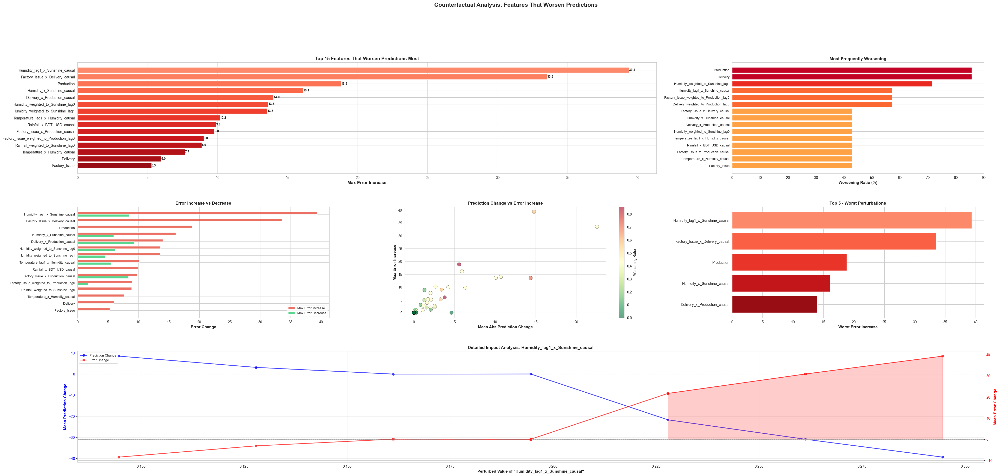


WORST VALUE CHANGES THAT WORSEN PREDICTIONS

Top 10 features with their worst perturbations:

--------------------------------------------------------------------------------

1. Humidity_lag1_x_Sunshine_causal
   Original Value: 0.1946
   ├─ WORST: Changing to 0.2946 (Δ +0.1000, +51.40%)
   │  └─ Increases error by 39.37 (1 samples worsened)
   └─ BEST: Changing to 0.0946 (Δ -0.1000)
      └─ Decreases error by 8.45

2. Factory_Issue_x_Delivery_causal
   Original Value: 0.0015
   ├─ WORST: Changing to 0.0349 (Δ +0.0333, +2196.64%)
   │  └─ Increases error by 33.53 (1 samples worsened)
   └─ BEST: Changing to -0.0985 (Δ -0.1000)
      └─ Decreases error by -0.00

3. Production
   Original Value: 0.0530
   ├─ WORST: Changing to 0.0197 (Δ -0.0333, -62.86%)
   │  └─ Increases error by 18.82 (1 samples worsened)
   └─ BEST: Changing to 0.0530 (Δ +0.0000)
      └─ Decreases error by -0.00

4. Humidity_x_Sunshine_causal
   Original Value: 0.1946
   ├─ WORST: Changing to 0.2946 (Δ +0.1000, +

,rank,feature_name,original_value,worst_value,worst_value_change,worst_value_change_pct,worst_error_increase,worst_worsening_samples,best_value,best_value_change,best_error_decrease
0,1,Humidity_lag1_x_Sunshine_causal,0.194558,0.294558,0.100000,5.139860e+01,39.374043,1,0.094558,-0.100000,-8.451167
1,2,Factory_Issue_x_Delivery_causal,0.001517,0.034851,0.033333,2.196638e+03,33.534315,1,-0.098483,-0.100000,0.000000
2,3,Production,0.053025,0.019692,-0.033333,-6.286333e+01,18.820489,1,0.053025,0.000000,0.000000
3,4,Humidity_x_Sunshine_causal,0.194558,0.294558,0.100000,5.139860e+01,16.111460,1,0.094558,-0.100000,-5.908319
4,5,Delivery_x_Production_causal,0.001515,0.068182,0.066667,4.400908e+03,13.993044,1,-0.098485,-0.100000,-9.357015
5,6,Humidity_weighted_to_Sunshine_lag0,-0.479373,-0.579373,-0.100000,2.086057e+01,13.614596,1,-0.412707,0.066667,-6.172232
6,7,Humidity_weighted_to_Sunshine_lag1,0.479279,0.379279,-0.100000,-2.086468e+01,13.539485,1,0.445946,-0.033333,-4.535392
7,8,Temperature_lag1_x_Humidity_causal,0.475730,0.575730,0.100000,2.102031e+01,10.173812,1,0.375730,-0.100000,-5.450152
8,9,Rainfall_x_BDT_USD_causal,0.000000,0.033333,0.033333,3.333333e+10,9.900337,1,-0.100000,-0.100000,0.000000
9,10,Factory_Issue_x_Production_causal,0.002817,0.102817,0.100000,3.550451e+03,9.785244,1,-0.097183,-0.100000,-8.378973



SAMPLE-LEVEL ANALYSIS

SAMPLE-LEVEL ANALYSIS: Sample Index 8379
Original Prediction: 1405.72
True Value: 1416.00
Original Error: 10.28

Top 10 feature perturbations that worsen this sample's prediction:
--------------------------------------------------------------------------------

Humidity_lag1_x_Sunshine_causal
  Original: 0.1946 → Perturbed: 0.2946 (Δ +0.1000)
  Prediction: 1405.72 → 1366.35 (Δ -39.37)
  Error: 10.28 → 49.65 (Δ +39.37) ⚠️

Factory_Issue_x_Delivery_causal
  Original: 0.0015 → Perturbed: 0.0349 (Δ +0.0333)
  Prediction: 1405.72 → 1459.81 (Δ +54.09)
  Error: 10.28 → 43.81 (Δ +33.53) ⚠️

Production
  Original: 0.0530 → Perturbed: 0.0197 (Δ -0.0333)
  Prediction: 1405.72 → 1386.90 (Δ -18.82)
  Error: 10.28 → 29.10 (Δ +18.82) ⚠️

Humidity_x_Sunshine_causal
  Original: 0.1946 → Perturbed: 0.2946 (Δ +0.1000)
  Prediction: 1405.72 → 1389.61 (Δ -16.11)
  Error: 10.28 → 26.39 (Δ +16.11) ⚠️

Delivery_x_Production_causal
  Original: 0.0015 → Perturbed: 0.0682 (Δ +0.0667)
  Pr

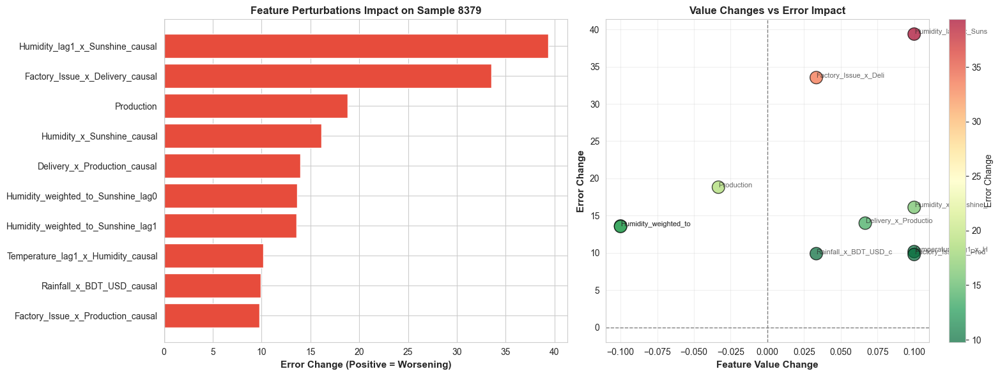


✓ All results saved to ../causality/ directory


In [118]:
# Perform detailed counterfactual analysis
print("\n" + "="*80)
print("STARTING DETAILED COUNTERFACTUAL ANALYSIS")
print("="*80)

# Choose model
model_to_use = models['CatBoost']  # or 'XGBoost'

# Get corresponding y values
y_sample = y_test.loc[X_sample.index]

# Run detailed analysis
feature_importance_df, detailed_changes_df, sample_level_df = counterfactual_feature_importance_detailed(
    X_sample=X_sample,
    y_true=y_sample,
    model=model_to_use,
    perturbation_method='percentile',
    percentiles=[5, 10, 25, 50, 75, 90, 95]
)

# Display results
print("\n" + "="*80)
print("FEATURE IMPORTANCE RANKING (By Max Error Increase)")
print("="*80)
display(feature_importance_df.head(20))

# Visualize prediction worsening
visualize_prediction_worsening(
    feature_importance_df=feature_importance_df,
    detailed_changes_df=detailed_changes_df,
    top_n=15,
    figure = plt.figure(figsize=(45, 20))
)

# Analyze worst perturbations
worst_perturbations_df = analyze_worst_perturbations(
    feature_importance_df=feature_importance_df,
    detailed_changes_df=detailed_changes_df,
    top_n=10
)

# Display worst perturbations table
display(worst_perturbations_df)

# Analyze specific samples
print("\n" + "="*80)
print("SAMPLE-LEVEL ANALYSIS")
print("="*80)

# Analyze first few samples
for i in range(min(3, len(X_sample))):
    create_sample_level_report(
        sample_level_df=sample_level_df,
        X_sample=X_sample,
        feature_importance_df=feature_importance_df,
        top_n_features=10,
        sample_idx_to_analyze=i
    )

# Save all results
feature_importance_df.to_csv('../causality/counterfactual_feature_importance.csv', index=False)
detailed_changes_df.to_csv('../causality/counterfactual_detailed_changes.csv', index=False)
sample_level_df.to_csv('../causality/counterfactual_sample_level.csv', index=False)
worst_perturbations_df.to_csv('../causality/counterfactual_worst_perturbations.csv', index=False)

print("\n✓ All results saved to ../causality/ directory")

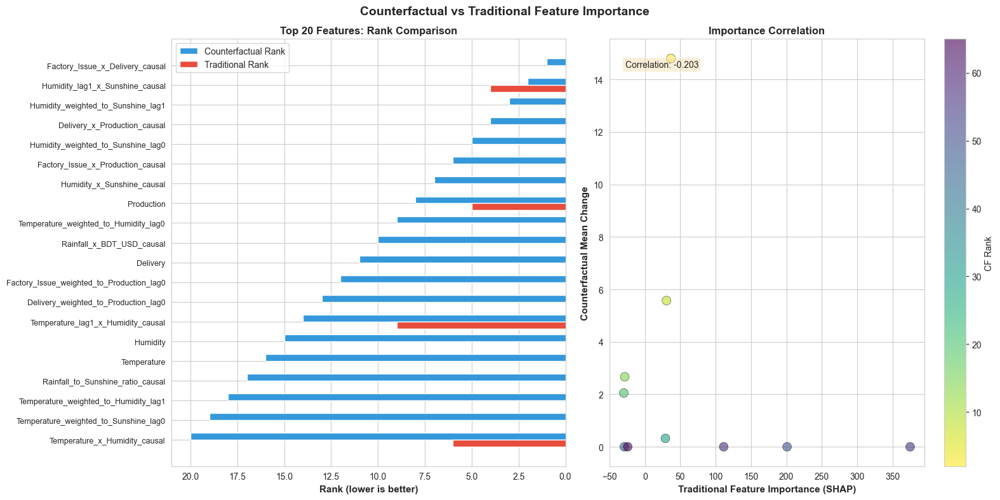


COMPARISON SUMMARY

Top 10 Features - Rank Comparison:
--------------------------------------------------------------------------------
Feature                                            |  CF Rank |  Trad Rank |   Diff
--------------------------------------------------------------------------------
Factory_Issue_x_Delivery_causal                    |        1 |        N/A |    N/A
Humidity_lag1_x_Sunshine_causal                    |        2 |          4 |     +2
Humidity_weighted_to_Sunshine_lag1                 |        3 |        N/A |    N/A
Delivery_x_Production_causal                       |        4 |        N/A |    N/A
Humidity_weighted_to_Sunshine_lag0                 |        5 |        N/A |    N/A
Factory_Issue_x_Production_causal                  |        6 |        N/A |    N/A
Humidity_x_Sunshine_causal                         |        7 |        N/A |    N/A
Production                                         |        8 |          5 |     -3
Temperature_weighted_to_Hu

In [119]:
# Compare with traditional feature importance (if you have it from previous analysis)
if 'importance_df' in locals():
    comparison_df = compare_counterfactual_with_traditional(
        cf_importance_df=cf_importance_percentile,
        traditional_importance_df=importance_df,
        top_n=20
    )
    
    # Save comparison
    comparison_df.to_csv('../causality/importance_comparison.csv', index=False)
    print("\n✓ Comparison saved to: ../causality/importance_comparison.csv")